In [ ]:
LOADING DATASETS KAGGLE DATA SOURCES

In [ ]:

# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES
# TO THE CORRECT LOCATION (/kaggle/input) IN YOUR NOTEBOOK,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

import os
import sys
from tempfile import NamedTemporaryFile
from urllib.request import urlopen
from urllib.parse import unquote, urlparse
from urllib.error import HTTPError
from zipfile import ZipFile
import tarfile
import shutil

CHUNK_SIZE = 40960
DATA_SOURCE_MAPPING = 'osic-pulmonary-fibrosis-progression:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-competitions-data%2Fkaggle-v2%2F20604%2F1357052%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240428%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240428T164500Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D9b2c5062240768629b1161df43c1a888c2fe81950099a396bf7bb5513763c07e7d0ac84741b50d830419736c900f8691426d924e59dda0b4ba408ed1538db3b7da90a10c1128f59a90b3ed4c7c643120ed8da0b4524313d9cc0a0f267ef6be88c4b1dd50e6688503984fa55dca5f6672e4451573de1b1dfc395f89596a6a596abc027044e9578279c97109d7eac5f68423c3338a17e7ca7497dac77d01eeba3a55d27a6b1449e6d539ebf05e7dfa65bccbfe6f597050085861fd48233f9071bd693075a9f907f0c53a0c7c90ec32fe1249dbebf834ba9d9d47a54554105d6f4ac582956bd794507dfb2a8f63d1a708368c24f1f0186f1f45c6a742dcd9830e18,efficientnet:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F642364%2F1139701%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240428%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240428T164500Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D1a3f4c58bc05dc278099a70851d978f1a82de7db8c82077812fd5b216fc12519d368c9bdbb6f993dedbec75c4f3d258940ce715d59e8e029d07a2afe4c1ef26a8588a1852f9df049448cf6ad2469affbecfd401ce5154652ed65f709f3952edabed6dc5509dcf349c332ba936843901daafaefe3fce99eb6f06d17caeed653037b66b34a59fdb0da16be53be83e0e0412d5785b65f5b4edcc1b9198e0c1ae73ed45c02fe412b17c0e4fe379ae74d33636657f046f095d9dc21ea97e8667bf91229696922e4f68b2b6ffae18035479afa55548fd5bc6ed69fd0badf2a2e6cb394ab61d1e34ae370a1d6b01218468dee2252df7b9768fc51b68ed381c77804cf49,kerasapplications:https%3A%2F%2Fstorage.googleapis.com%2Fkaggle-data-sets%2F807680%2F1383977%2Fbundle%2Farchive.zip%3FX-Goog-Algorithm%3DGOOG4-RSA-SHA256%26X-Goog-Credential%3Dgcp-kaggle-com%2540kaggle-161607.iam.gserviceaccount.com%252F20240428%252Fauto%252Fstorage%252Fgoog4_request%26X-Goog-Date%3D20240428T164500Z%26X-Goog-Expires%3D259200%26X-Goog-SignedHeaders%3Dhost%26X-Goog-Signature%3D7f79b8a3cd646a805acd4821434ff1f4eb4f4df780f1fd04a7d0a76e1de62a9c89eb4a08a4eed12a9fdbf4f9c2b8b0b357b97df2bf95b29638cc46a7c4d1088534a0197a0ec2b76b9ecd60db1c004787eaea66136370a728f5da9c75ca04ef2a8ba39c6acdbb3b805b8ddaa0f0e4de3f1982c240f38e2b0375b2e7057343cccecc0feb1ab50f2ebef18bd960a7c99ff0ecafda32e7d6997e2010e75f7c37a3ea423d128287e64a95d46d495c2c1737d480185354a5735ac8aace5dd69f1069ce165e87d631f6f1f6d487be22cbaccc0fc9fb80b1818f5139382e016b3bda9009390ea6a7293a2a4ea7e67f32de0a84f533236fb60f2838ecd6e0423551fc606d'

KAGGLE_INPUT_PATH='/kaggle/input'
KAGGLE_WORKING_PATH='/kaggle/working'
KAGGLE_SYMLINK='kaggle'

!umount /kaggle/input/ 2> /dev/null
shutil.rmtree('/kaggle/input', ignore_errors=True)
os.makedirs(KAGGLE_INPUT_PATH, 0o777, exist_ok=True)
os.makedirs(KAGGLE_WORKING_PATH, 0o777, exist_ok=True)

try:
  os.symlink(KAGGLE_INPUT_PATH, os.path.join("..", 'input'), target_is_directory=True)
except FileExistsError:
  pass
try:
  os.symlink(KAGGLE_WORKING_PATH, os.path.join("..", 'working'), target_is_directory=True)
except FileExistsError:
  pass

for data_source_mapping in DATA_SOURCE_MAPPING.split(','):
    directory, download_url_encoded = data_source_mapping.split(':')
    download_url = unquote(download_url_encoded)
    filename = urlparse(download_url).path
    destination_path = os.path.join(KAGGLE_INPUT_PATH, directory)
    try:
        with urlopen(download_url) as fileres, NamedTemporaryFile() as tfile:
            total_length = fileres.headers['content-length']
            print(f'Downloading {directory}, {total_length} bytes compressed')
            dl = 0
            data = fileres.read(CHUNK_SIZE)
            while len(data) > 0:
                dl += len(data)
                tfile.write(data)
                done = int(50 * dl / int(total_length))
                sys.stdout.write(f"\r[{'=' * done}{' ' * (50-done)}] {dl} bytes downloaded")
                sys.stdout.flush()
                data = fileres.read(CHUNK_SIZE)
            if filename.endswith('.zip'):
              with ZipFile(tfile) as zfile:
                zfile.extractall(destination_path)
            else:
              with tarfile.open(tfile.name) as tarfile:
                tarfile.extractall(destination_path)
            print(f'\nDownloaded and uncompressed: {directory}')
    except HTTPError as e:
        print(f'Failed to load (likely expired) {download_url} to path {destination_path}')
        continue
    except OSError as e:
        print(f'Failed to load {download_url} to path {destination_path}')
        continue

print('Data source import complete.')


TOPIC : AI in Healthcaare

Problem Statement :

Imagine one day, your breathing became consistently labored and shallow. Months later you were finally diagnosed with pulmonary fibrosis, a disorder with no known cause and no known cure, created by scarring of the lungs. If that happened to you, you would want to know your prognosis. That’s where a troubling disease becomes frightening for the patient: outcomes can range from long-term stability to rapid deterioration, but doctors aren’t easily able to tell where an individual may fall on that spectrum. Your help, and data science, may be able to aid in this prediction, which would dramatically help both patients and clinicians.

Current methods make fibrotic lung diseases difficult to treat, even with access to a chest CT scan. In addition, the wide range of varied prognoses create issues organizing clinical trials. Finally, patients suffer extreme anxiety—in addition to fibrosis-related symptoms—from the disease’s opaque path of progression.

Open Source Imaging Consortium (OSIC) is a not-for-profit, co-operative effort between academia, industry and philanthropy. The group enables rapid advances in the fight against Idiopathic Pulmonary Fibrosis (IPF), fibrosing interstitial lung diseases (ILDs), and other respiratory diseases, including emphysematous conditions. Its mission is to bring together radiologists, clinicians and computational scientists from around the world to improve imaging-based treatments.

In this project, you’ll predict a patient’s severity of decline in lung function based on a CT scan of their lungs. You’ll determine lung function based on output from a spirometer, which measures the volume of air inhaled and exhaled. The challenge is to use machine learning techniques to make a prediction with the image, metadata, and baseline FVC as input.

If successful, patients and their families would better understand their prognosis when they are first diagnosed with this incurable lung disease. Improved severity detection would also positively impact treatment trial design and accelerate the clinical development of novel treatments.


DATA PREPROCESSING

1. Importing all necessay libraries
2. Loading the dataset
3. Exploratory Data Analysis
        Concise Summary
        Missing Values
        Patients Counts
        Unique patients
        Frequency of a patient in Train set
        Number of CT Scans for each patient in Train set / Test set
        Distribution of weeks / Patients age / Gender
        Distribution of Age vs Gende
        Distribution of 'SmokingStatus' featur / FVC
        FVC of oldest and youngest person
4. Visualising DICOM Images
5. Model Training

**IMPORTING LIBRARIES**

In [ ]:
# Import Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import random
import math
import matplotlib
from termcolor import colored
import os
from os import listdir
from os.path import join, getsize
import glob
import cv2

#plotly
import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import iplot
import cufflinks
cufflinks.go_offline()
cufflinks.set_config_file(world_readable=True, theme='pearl')

#
from skimage import measure
from skimage.morphology import disk, opening, closing

import tensorflow as tf
from tensorflow.keras import Model
import tensorflow.keras.backend as K
import tensorflow.keras.layers as L
import tensorflow.keras.models as M
from sklearn.metrics import mean_absolute_error
from sklearn.model_selection import train_test_split, KFold

from tensorflow.keras.layers import (
    Dense, Dropout, Activation, Flatten, Input, GlobalAveragePooling2D, Add, Conv2D, AveragePooling2D,
    LeakyReLU, Concatenate
)


# Magic function to display In-Notebook display
%matplotlib inline

# Setting seabon style
sns.set(style='darkgrid', palette='Set2')

# Suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Settings for pretty nice plots
plt.style.use('fivethirtyeight')
plt.show()

# pydicom
import pydicom

# Print versions of libraries
print(f"Numpy version : Numpy {np.__version__}")
print(f"Pandas version : Pandas {pd.__version__}")
print(f"Matplotlib version : Matplotlib {matplotlib.__version__}")
print(f"Seaborn version : Seaborn {sns.__version__}")
print(f"Tensorflow version : Tensorflow {tf.__version__}")

Numpy version : Numpy 1.18.5
Pandas version : Pandas 1.0.3
Matplotlib version : Matplotlib 3.2.1
Seaborn version : Seaborn 0.10.0
Tensorflow version : Tensorflow 2.2.0


In [ ]:
# Install the EfficientNet Keras Library
!pip install ../input/kerasapplications/keras-team-keras-applications-3b180cb -f ./ --no-index
!pip install ../input/efficientnet/efficientnet-1.1.0/ -f ./ --no-index

Looking in links: ./
Processing /kaggle/input/kerasapplications/keras-team-keras-applications-3b180cb
  Created wheel for Keras-Applications: filename=Keras_Applications-1.0.8-py3-none-any.whl size=50704 sha256=434273701450bf0d7f1d6f09c365102ae65bc953435ca66c4135a4f9af474877
  Stored in directory: /root/.cache/pip/wheels/f4/96/13/eccdd9391bd8df958d78851b98ec4dc207ba05b67b011eb70a
Successfully built Keras-Applications
Looking in links: ./
Processing /kaggle/input/efficientnet/efficientnet-1.1.0
  Created wheel for efficientnet: filename=efficientnet-1.1.0-py3-none-any.whl size=14141 sha256=422cd7b83fff8f8bd15769f9a23bd5e1cc66d0fac1bd45be53a811ffcbecb335
  Stored in directory: /root/.cache/pip/wheels/24/f5/31/3cc20871288fe532128224a3f5af7b4d67efb9835bd5683522
Successfully built efficientnet


In [ ]:
import efficientnet.tfkeras as efn

## Sets integer starting value

In [ ]:
def seed_everything(seed=100):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    tf.random.set_seed(seed)

seed_everything(101)

# <div class="alert alert-block alert-info">2. <a id='dataLoad'>Load Data</a></div>

In [ ]:
# List files available
base_dir = "../input/osic-pulmonary-fibrosis-progression/"

In [ ]:
list(os.listdir(base_dir))

['sample_submission.csv', 'train.csv', 'test.csv', 'test', 'train']

### Dataset Details
* train.csv - the training set, contains full history of clinical information
* test.csv - the test set, contains only the baseline measurement
* train/ - contains the training patients' baseline CT scan in DICOM format
* test/ - contains the test patients' baseline CT scan in DICOM format
* sample_submission.csv - demonstrates the submission format

In [ ]:
# Train & Test set shape
train_df = pd.read_csv('../input/osic-pulmonary-fibrosis-progression/train.csv', encoding = 'latin-1')
test_df = pd.read_csv('../input/osic-pulmonary-fibrosis-progression/test.csv', encoding = 'latin-1')
submission_df = pd.read_csv('../input/osic-pulmonary-fibrosis-progression/sample_submission.csv', encoding = 'latin-1')

print(colored('Training data set shape.......... : ','yellow'),train_df.shape)
print(colored('Test data set shape...............: ','red'),test_df.shape)
print(colored('Submission data set shape.........: ','blue'),submission_df.shape)

Training data set shape.......... :  (1549, 7)
Test data set shape...............:  (5, 7)
Submission data set shape.........:  (730, 3)


In [ ]:
# print top 5 rows of train set
train_df.head()

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
0,ID00007637202177411956430,-4,2315,58.253649,79,Male,Ex-smoker
1,ID00007637202177411956430,5,2214,55.712129,79,Male,Ex-smoker
2,ID00007637202177411956430,7,2061,51.862104,79,Male,Ex-smoker
3,ID00007637202177411956430,9,2144,53.950679,79,Male,Ex-smoker
4,ID00007637202177411956430,11,2069,52.063412,79,Male,Ex-smoker


In [ ]:
# print top 5 rows of test set
test_df.head()

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
0,ID00419637202311204720264,6,3020,70.186855,73,Male,Ex-smoker
1,ID00421637202311550012437,15,2739,82.045291,68,Male,Ex-smoker
2,ID00422637202311677017371,6,1930,76.672493,73,Male,Ex-smoker
3,ID00423637202312137826377,17,3294,79.258903,72,Male,Ex-smoker
4,ID00426637202313170790466,0,2925,71.824968,73,Male,Never smoked


### Columns Details in train.csv and test.csv
* **Patient** - a unique Id for each patient (also the name of the patient's DICOM folder)
* **Weeks** - the relative number of weeks pre/post the baseline CT (may be negative)
* **FVC** - the recorded lung capacity in ml
* **Percent** - a computed field which approximates the patient's FVC as a percent of the typical FVC for a person of similar characteristics
* **Age**
* **Sex**
* **SmokingStatus**

# <div class="alert alert-block alert-info">3. <a id='EDA'>Exploratory Data Analysis</a></div>

The purpose of exploratory data analysis is to: Check for missing data and other mistakes. Gain maximum insight into the data set and its underlying structure. Uncover a parsimonious model, one which explains the data with a minimum number of predictor variables.

## Concise Summary

In [ ]:
# Null values and Data types
print(colored('Train Set !!', 'yellow'))
print(colored('------------', 'yellow'))
print(train_df.info())

print('\n')

print(colored('Test Set !!','red'))
print(colored('-----------','red'))
print(test_df.info())

Train Set !!
------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1549 entries, 0 to 1548
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Patient        1549 non-null   object 
 1   Weeks          1549 non-null   int64  
 2   FVC            1549 non-null   int64  
 3   Percent        1549 non-null   float64
 4   Age            1549 non-null   int64  
 5   Sex            1549 non-null   object 
 6   SmokingStatus  1549 non-null   object 
dtypes: float64(1), int64(3), object(3)
memory usage: 84.8+ KB
None


Test Set !!
-----------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Patient        5 non-null      object 
 1   Weeks          5 non-null      int64  
 2   FVC            5 non-null      int64  
 3   Percent        5 non-null      float64
 4   Age      

There is no missing values in train_df and test_df.

## Descriptive Statistics

In [ ]:
# Null values and Data types
print(colored('Train Set !!', 'yellow'))
print(train_df.describe())

Train Set !!
             Weeks          FVC      Percent          Age
count  1549.000000  1549.000000  1549.000000  1549.000000
mean     31.861846  2690.479019    77.672654    67.188509
std      23.247550   832.770959    19.823261     7.057395
min      -5.000000   827.000000    28.877577    49.000000
25%      12.000000  2109.000000    62.832700    63.000000
50%      28.000000  2641.000000    75.676937    68.000000
75%      47.000000  3171.000000    88.621065    72.000000
max     133.000000  6399.000000   153.145378    88.000000


## Missing Values

In [ ]:
# Total missing values for each feature
print(colored('Missing values in Train Set !!', 'yellow'))
print(train_df.isnull().sum())

print("\n")

print(colored('Missing values in Test Set !!', 'red'))
print(test_df.isnull().sum())

Missing values in Train Set !!
Patient          0
Weeks            0
FVC              0
Percent          0
Age              0
Sex              0
SmokingStatus    0
dtype: int64


Missing values in Test Set !!
Patient          0
Weeks            0
FVC              0
Percent          0
Age              0
Sex              0
SmokingStatus    0
dtype: int64


In [ ]:
train_df.groupby( ['Sex','SmokingStatus'] )['FVC'].agg( ['mean','std','count'] ).sort_values(by=['Sex','count'],ascending=False)

mean         std  count
Sex    SmokingStatus                                   
Male   Ex-smoker         2886.024705  769.105923    931
       Never smoked      2878.034934  667.921434    229
       Currently smokes  3300.828125  694.108554     64
Female Never smoked      1775.985000  584.208226    200
       Ex-smoker         1901.906542  450.294485    107
       Currently smokes  2868.833333   71.124787     18

No missing value in either train/test datasets.

## Patients Counts

In [ ]:
# Total number of Patient in the dataset(train+test)

print(colored("Total Patients in Train set... : ", 'yellow'),train_df['Patient'].count())
print(colored("Total Patients in Test set.... : ", 'red'),test_df['Patient'].count())
print("\n")
print(colored("Unique Patients in Train set...: ", 'yellow'),train_df['Patient'].nunique())
print(colored("Unique Patients in Test set....: ", 'red'),test_df['Patient'].nunique())

Total Patients in Train set... :  1549
Total Patients in Test set.... :  5


Unique Patients in Train set...:  176
Unique Patients in Test set....:  5


In [ ]:
print(colored("Few most repeated Patients in Train set: ", 'yellow'))
print(train_df['Patient'].value_counts().head())

print("\n")

print(colored("Few most repeated Patients in Test set: ", 'red'))
print(test_df['Patient'].value_counts().head())

Few most repeated Patients in Train set: 
ID00388637202301028491611    10
ID00400637202305055099402    10
ID00119637202215426335765    10
ID00421637202311550012437    10
ID00229637202260254240583    10
Name: Patient, dtype: int64


Few most repeated Patients in Test set: 
ID00423637202312137826377    1
ID00419637202311204720264    1
ID00421637202311550012437    1
ID00422637202311677017371    1
ID00426637202313170790466    1
Name: Patient, dtype: int64


## Unique patients

Let's create a new data set having only unique patient details.

In [ ]:
train_df_unique = train_df[['Patient', 'Age', 'Sex', 'SmokingStatus']].drop_duplicates().reset_index()
print(colored("Shape of unique patient data set : ",'yellow'),train_df_unique.shape)
train_df_unique.head()

Shape of unique patient data set :  (176, 5)


,index,Patient,Age,Sex,SmokingStatus
0,0,ID00007637202177411956430,79,Male,Ex-smoker
1,9,ID00009637202177434476278,69,Male,Ex-smoker
2,18,ID00010637202177584971671,60,Male,Ex-smoker
3,27,ID00011637202177653955184,72,Male,Ex-smoker
4,36,ID00012637202177665765362,65,Male,Never smoked


## Frequency of a patient in Train set

Let's count how many times a particular patient repeated in train set.

In [ ]:
patient_feq = train_df.groupby(['Patient'])['Patient'].count()
patient_feq = pd.DataFrame({'Patient':patient_feq.index, 'Frequency':patient_feq.values})

# Merge two dataframes based on patient's ids.
train_df_unique = pd.merge(train_df_unique,patient_feq,how='inner',on='Patient')

In [ ]:
train_df_unique.sort_values(by='Frequency', ascending=False).head()

,index,Patient,Age,Sex,SmokingStatus,Frequency
42,368,ID00105637202208831864134,64,Male,Ex-smoker,10
49,428,ID00119637202215426335765,57,Male,Ex-smoker,10
99,875,ID00229637202260254240583,71,Male,Ex-smoker,10
67,588,ID00140637202231728595149,58,Male,Currently smokes,10
159,1396,ID00388637202301028491611,53,Male,Ex-smoker,10


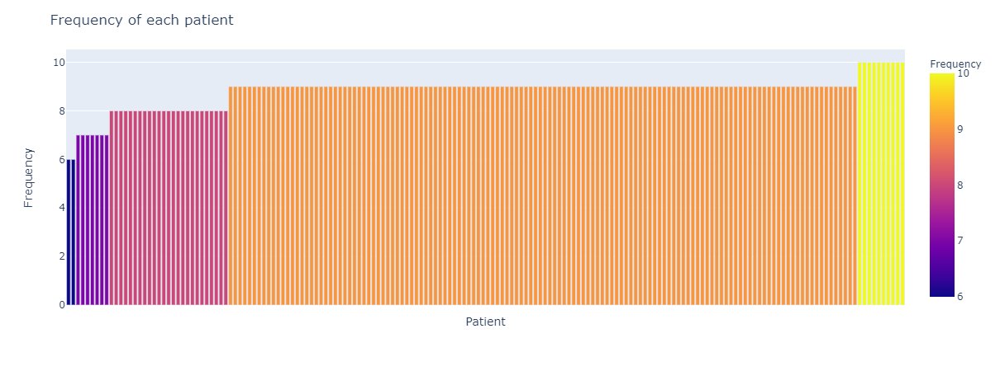

In [ ]:
fig = px.bar(train_df_unique, x='Patient',y ='Frequency',color='Frequency')
fig.update_layout(xaxis={'categoryorder':'total ascending'},title='Frequency of each patient')
fig.update_xaxes(showticklabels=False)
fig.show()

Every patient is observed between 6 to 10 times however most of them have observed 9 times.

## Number of CT Scans for each patient in Train set

we are provided with a baseline chest CT scans at week intervats for each patients. So lets count how many CT Scan have each patient.

In [ ]:
# Creating unique patient lists
# (here patient == dictory and files == CT Scan)
train_dir = '../input/osic-pulmonary-fibrosis-progression/train/'

patient_ids = os.listdir(train_dir)
patient_ids = sorted(patient_ids)

#Creating a new blank dataframe
CtScan = pd.DataFrame(columns=['Patient','CtScanCount'])


for patient_id in patient_ids:
    # count number of images in each folder
    cnt = len(os.listdir(train_dir + patient_id))
    # insert patient id and ct scan count in dataframe
    CtScan.loc[len(CtScan)] = [patient_id,cnt]


# Merge two dataframes based on patient's ids.
patient_df = pd.merge(train_df_unique,CtScan,how='inner',on='Patient')

# Reset index
# https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.reset_index.html
patient_df = patient_df.reset_index(drop=True)

# Print new dataframe
patient_df.head()


,index,Patient,Age,Sex,SmokingStatus,Frequency,CtScanCount
0,0,ID00007637202177411956430,79,Male,Ex-smoker,9,30
1,9,ID00009637202177434476278,69,Male,Ex-smoker,9,394
2,18,ID00010637202177584971671,60,Male,Ex-smoker,9,106
3,27,ID00011637202177653955184,72,Male,Ex-smoker,9,31
4,36,ID00012637202177665765362,65,Male,Never smoked,9,49


In [ ]:
print(colored("CT Scans numbers in Train set ","yellow"))
print(colored("Maximum number of CT Scans for a patient.... : ","blue"),patient_df['CtScanCount'].max())
print(colored("Minimum number of CT Scans for a patient.... : ","blue"),patient_df['CtScanCount'].min())
print(colored("Average number of CT Scans per patient...... : ","blue"),round(patient_df['CtScanCount'].mean(),3))
print(colored("Total number of CT Scans of all patients.... : ","blue"),patient_df['CtScanCount'].sum())
print(colored("Median of CT Scans counts................... : ","blue"),patient_df['CtScanCount'].median())

CT Scans numbers in Train set 
Maximum number of CT Scans for a patient.... :  1018
Minimum number of CT Scans for a patient.... :  12
Average number of CT Scans per patient...... :  187.648
Total number of CT Scans of all patients.... :  33026
Median of CT Scans counts................... :  98.0


Huge imbalance in the number of CT scans: half of the patients have less that 100 CT scans.

## Number of CT Scans for each patient in Test set

In [ ]:
# Creating unique patient lists
# (here patient == dictory and files == CT Scan)
test_dir = '../input/osic-pulmonary-fibrosis-progression/test/'

test_patient_ids = os.listdir(test_dir)
test_patient_ids = sorted(test_patient_ids)

#Creating a new blank dataframe
TestCtScan = pd.DataFrame(columns=['Patient','CtScanCount'])

for patient_id in test_patient_ids:
    # count number of images in each folder
    cnt = len(os.listdir(test_dir + patient_id))
    # insert patient id and ct scan count in dataframe
    TestCtScan.loc[len(TestCtScan)] = [patient_id,cnt]


# Merge two dataframes based on patient's ids.
test_patient_df = pd.merge(test_df,TestCtScan,how='inner',on='Patient').reset_index()

# Print new dataframe
test_patient_df.head()

,index,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus,CtScanCount
0,0,ID00419637202311204720264,6,3020,70.186855,73,Male,Ex-smoker,28
1,1,ID00421637202311550012437,15,2739,82.045291,68,Male,Ex-smoker,62
2,2,ID00422637202311677017371,6,1930,76.672493,73,Male,Ex-smoker,473
3,3,ID00423637202312137826377,17,3294,79.258903,72,Male,Ex-smoker,290
4,4,ID00426637202313170790466,0,2925,71.824968,73,Male,Never smoked,408


In [ ]:
print(colored("CT Scans numbers in Test set ","red"))
print(colored("Maximum number of CT Scans for a patient... : ","green"),test_patient_df['CtScanCount'].max())
print(colored("Minimum number of CT Scans for a patient... : ","green"),test_patient_df['CtScanCount'].min())
print(colored("Average number of CT Scans per patient..... : ","green"),test_patient_df['CtScanCount'].mean())
print(colored("Total number of CT Scans of all patients... : ","green"),test_patient_df['CtScanCount'].sum())

CT Scans numbers in Test set 
Maximum number of CT Scans for a patient... :  473
Minimum number of CT Scans for a patient... :  28
Average number of CT Scans per patient..... :  252.2
Total number of CT Scans of all patients... :  1261


## Distribution of weeks

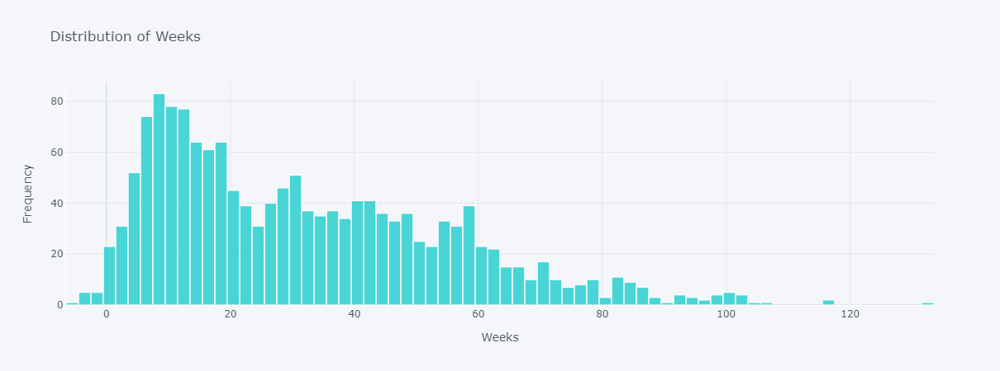

In [ ]:
train_df['Weeks'].iplot(kind='hist',
                        bins=100, xTitle='Weeks', yTitle='Frequency',
                        linecolor='white',opacity=0.7,
                        color='rgb(0, 200, 200)', theme='pearl',
                        bargap=0.01, title='Distribution of Weeks')

Most of the patients CT scans done in between 4th to 20th week.

## Distribution of Patients age

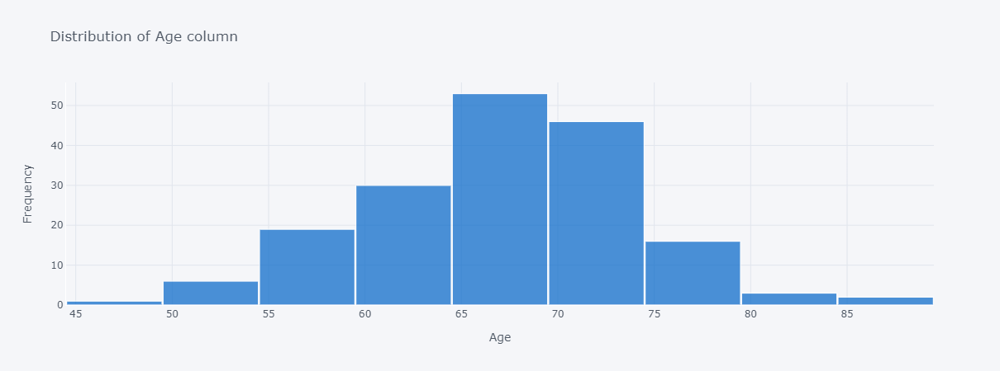

In [ ]:
patient_df['Age'].iplot(kind='hist',
                        bins=10, xTitle='Age', yTitle='Frequency',
                        linecolor='white',opacity=0.7,
                        color='rgb(0, 100, 200)', theme='pearl',
                        bargap=0.01, title='Distribution of Age column')

Range of patients age is between 48-88 years where we have more records for patients in the age range 64-74 years.

### Distribution of Patient gender

In [ ]:
print(colored("Gender wise distribution of patients :","blue"))
print(patient_df['Sex'].value_counts())

Gender wise distribution of patients :
Male      139
Female     37
Name: Sex, dtype: int64


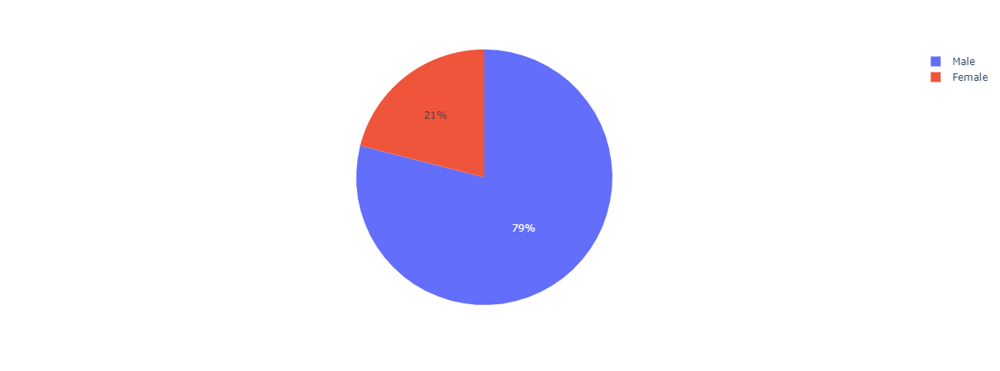

In [ ]:
sex_count = patient_df["Sex"].value_counts()
sex_labels = patient_df["Sex"].unique()

fig = px.pie(patient_df, values=sex_count, names=sex_labels, hover_name=sex_labels)
fig.show()

More number of male patients than female patients.

### Distribution of Age vs Gender

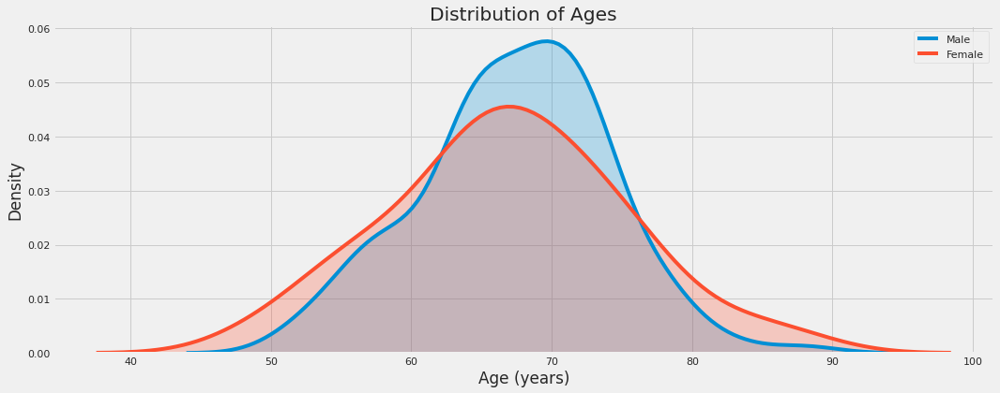

In [ ]:
plt.figure(figsize=(16, 6))

sns.kdeplot(patient_df[patient_df['Sex'] == 'Male']['Age'], label = 'Male',shade=True)
sns.kdeplot(patient_df[patient_df['Sex'] == 'Female']['Age'], label = 'Female',shade=True)

plt.xlabel('Age (years)');
plt.ylabel('Density');
plt.title('Distribution of Ages');

Male and female records are almost distributed throughout the age range.

### Distribution of 'SmokingStatus' feature

In [ ]:
print(colored('Total Smoking counts', 'red'))
print(patient_df['SmokingStatus'].value_counts())

print("\n")
print(colored("Male Smoking counts",'blue'))
print(patient_df[patient_df['Sex']=='Male']['SmokingStatus'].value_counts())

print("\n")
print(colored("Female Smoking counts",'green'))
print(patient_df[patient_df['Sex']=='Female']['SmokingStatus'].value_counts())

Total Smoking counts
Ex-smoker           118
Never smoked         49
Currently smokes      9
Name: SmokingStatus, dtype: int64


Male Smoking counts
Ex-smoker           106
Never smoked         26
Currently smokes      7
Name: SmokingStatus, dtype: int64


Female Smoking counts
Never smoked        23
Ex-smoker           12
Currently smokes     2
Name: SmokingStatus, dtype: int64


### Distribution of Age vs SmokingStatus

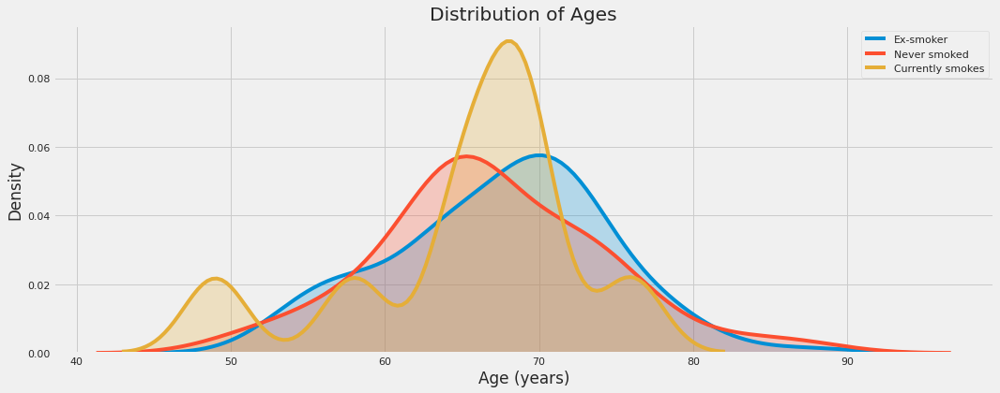

In [ ]:
plt.figure(figsize=(16, 6))

sns.kdeplot(patient_df.loc[patient_df['SmokingStatus'] == 'Ex-smoker', 'Age'], label = 'Ex-smoker',shade=True)
sns.kdeplot(patient_df.loc[patient_df['SmokingStatus'] == 'Never smoked', 'Age'], label = 'Never smoked',shade=True)
sns.kdeplot(patient_df.loc[patient_df['SmokingStatus'] == 'Currently smokes', 'Age'], label = 'Currently smokes', shade=True)

# Labeling of plot
plt.xlabel('Age (years)');
plt.ylabel('Density');
plt.title('Distribution of Ages');

### Gender wise smoking distribution

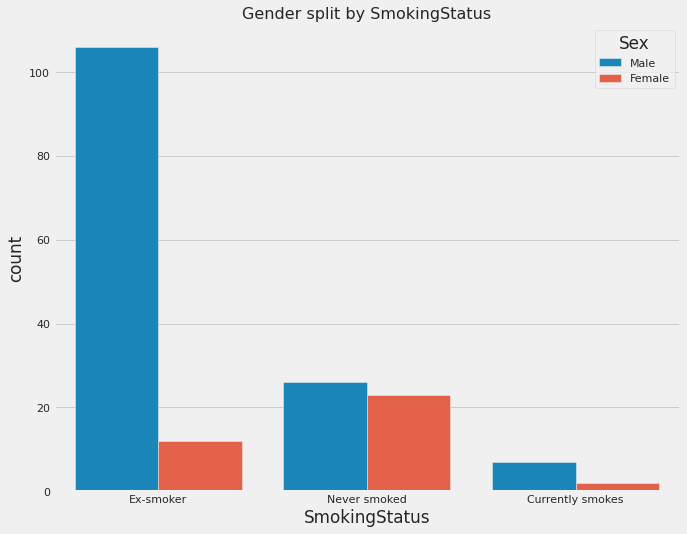

In [ ]:
plt.figure(figsize=(10,8))
sns.countplot(x='SmokingStatus', data=patient_df, hue='Sex')
plt.title('Gender split by SmokingStatus', fontsize=16)
plt.show()

Records with patient who have never smoked have almost equal distribution of male and female patients whereas majority of ex-smokers are males.

In [ ]:
print(colored("Maximum value of FVC... :",'blue'),colored(train_df['FVC'].max(),'blue'))
print(colored("Minimum value of FVC... :",'green'),colored(train_df['FVC'].min(),'green'))

print("\n")

# Distribution of FVC
print(colored("Distribution of FVC","yellow"))
print(colored(train_df['FVC'].value_counts(normalize=False, ascending=False, bins=62).head(),"yellow"))

Maximum value of FVC... : 6399
Minimum value of FVC... : 827


Distribution of FVC
(2804.161, 2894.032]    96
(2264.935, 2354.806]    77
(2085.194, 2175.065]    75
(2714.29, 2804.161]     70
(2894.032, 2983.903]    65
Name: FVC, dtype: int64


### FVC Distribution

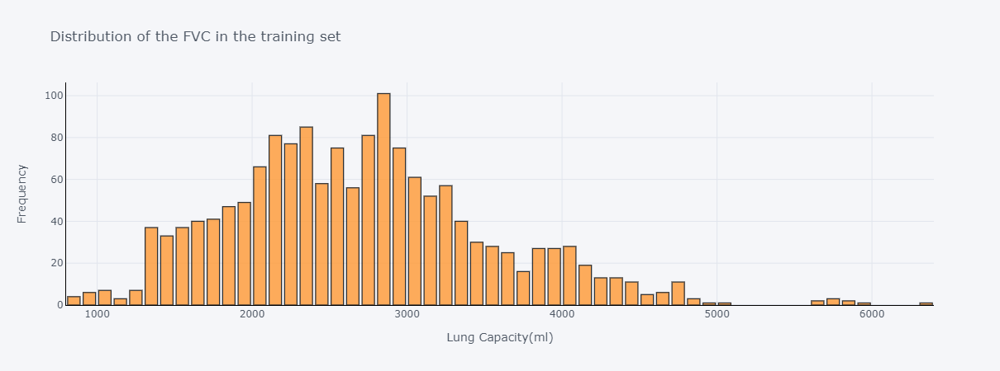

In [ ]:
train_df['FVC'].iplot(kind='hist',
                      xTitle='Lung Capacity(ml)',
                      yTitle='Frequency',
                      linecolor='black',
                      bargap=0.2,
                      title='Distribution of the FVC in the training set')

### FVC vs Smoking Status

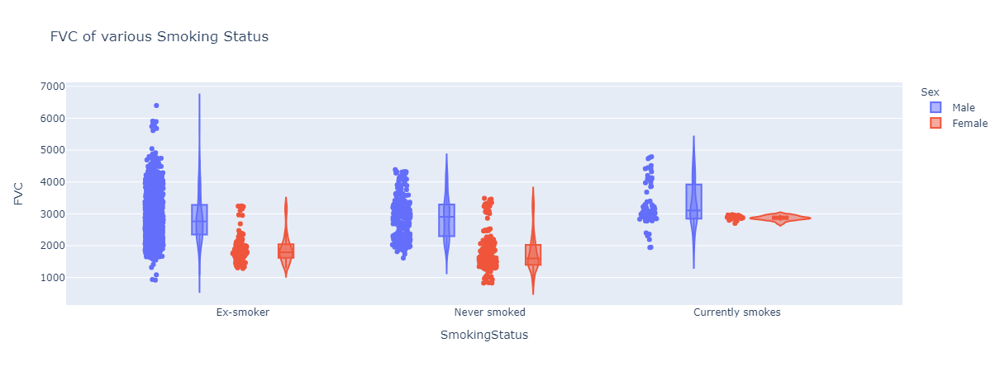

In [ ]:
fig = px.violin(train_df, y='FVC', x='SmokingStatus',
                box=True, color='Sex', points="all", hover_data=train_df.columns, title="FVC of various Smoking Status")
fig.show()

### FVC vs Age

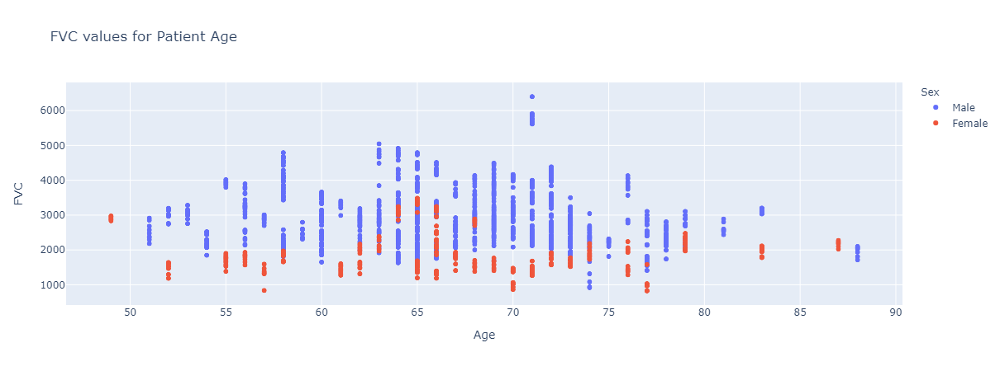

In [ ]:
fig = px.scatter(train_df, x="Age", y="FVC", color='Sex', title='FVC values for Patient Age')
fig.show()

Males have higher FVC than females irrespective of age.

In [ ]:
train_df[train_df['FVC'] > 5000].sort_values(by='FVC', ascending=False)

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus
822,ID00219637202258203123958,0,6399,153.012912,71,Male,Ex-smoker
824,ID00219637202258203123958,7,5910,141.319943,71,Male,Ex-smoker
829,ID00219637202258203123958,40,5895,140.961263,71,Male,Ex-smoker
827,ID00219637202258203123958,17,5844,139.741750,71,Male,Ex-smoker
830,ID00219637202258203123958,56,5768,137.924438,71,Male,Ex-smoker
826,ID00219637202258203123958,11,5763,137.804878,71,Male,Ex-smoker
825,ID00219637202258203123958,9,5739,137.230990,71,Male,Ex-smoker
823,ID00219637202258203123958,4,5678,135.772358,71,Male,Ex-smoker
828,ID00219637202258203123958,27,5613,134.218077,71,Male,Ex-smoker
124,ID00032637202181710233084,30,5045,119.629138,63,Male,Ex-smoker


### FVC vs Week

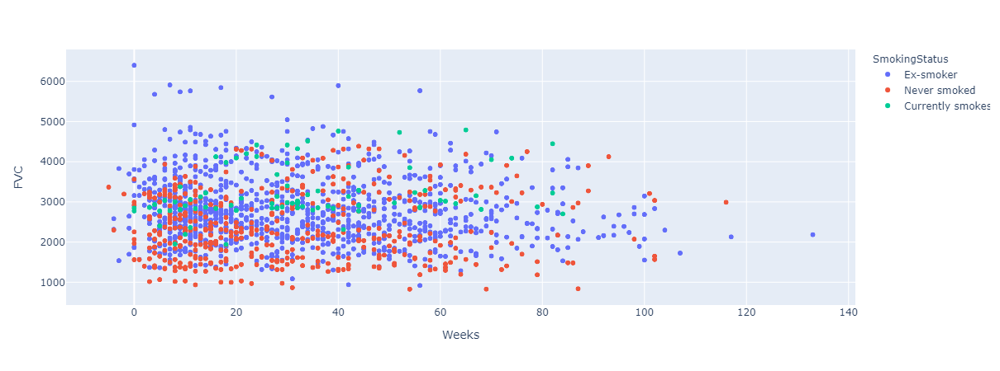

In [ ]:
fig = go.Figure()
fig = px.scatter(train_df, x="Weeks", y="FVC", color='SmokingStatus')
fig.show()

Most of the FVC test is done in between 0 to 20 weeks. Also Ex-smoker males have more FVC than others.

### FVC of oldest and youngest person

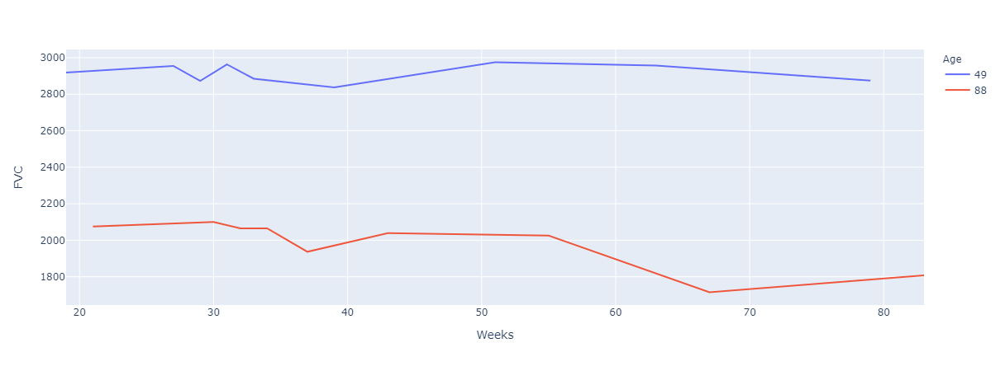

In [ ]:
# patient = train_df[train_df['FVC'] == train_df['FVC'].max()]
patient = train_df[(train_df['Age'] == train_df['Age'].max()) | (train_df['Age'] == train_df['Age'].min())]
fig = px.line(patient, x="Weeks", y="FVC", color='Age',line_group="Sex", hover_name="SmokingStatus")
fig.show()

Aging is associated with progressive decline in lung function as shown in predicted by above plot that FVC of older person is less than younger person.

## Percent
Percent approximates the patient's FVC as a percent of the typical FVC for a person of similar characteristics. Percentage with normal test values falling between 80% and 120% of the average values.

In [ ]:
print(colored("Maximum value of Percent... :",'blue'),colored(train_df['Percent'].max(),'blue'))
print(colored("Minimum value of Percent... :",'green'),colored(train_df['Percent'].min(),'green'))

print("\n")

# Distribution of Percent
print(colored("Distribution of Percent","yellow"))
print(colored(train_df['Percent'].value_counts(normalize=False, ascending=False, bins=62).head(),"yellow"))

Maximum value of Percent... : 153.145377828922
Minimum value of Percent... : 28.877576671694303


Distribution of Percent
(64.955, 66.96]     77
(78.986, 80.99]     70
(66.96, 68.964]     69
(58.942, 60.947]    67
(60.947, 62.951]    67
Name: Percent, dtype: int64


### Percent Distribution

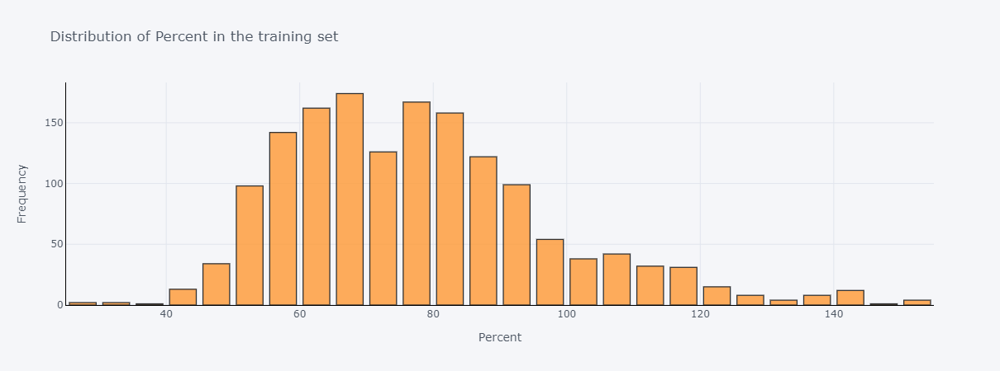

In [ ]:
train_df['Percent'].iplot(kind='hist',
                      xTitle='Percent',
                      yTitle='Frequency',
                      linecolor='black',
                      bargap=0.2,
                      title='Distribution of Percent in the training set')

### Percent vs SmokingStatus

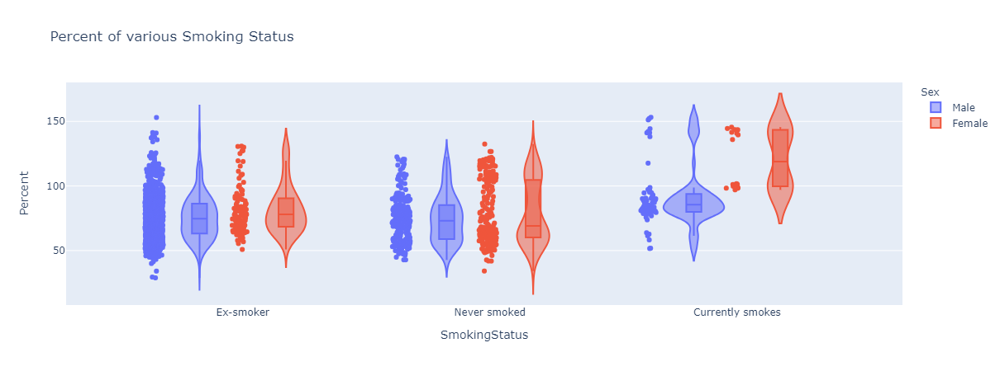

In [ ]:
fig = px.violin(train_df, y='Percent', x='SmokingStatus',
                box=True, color='Sex', points="all", hover_data=train_df.columns, title="Percent of various Smoking Status")
fig.show()

### Percent of oldest and youngest person

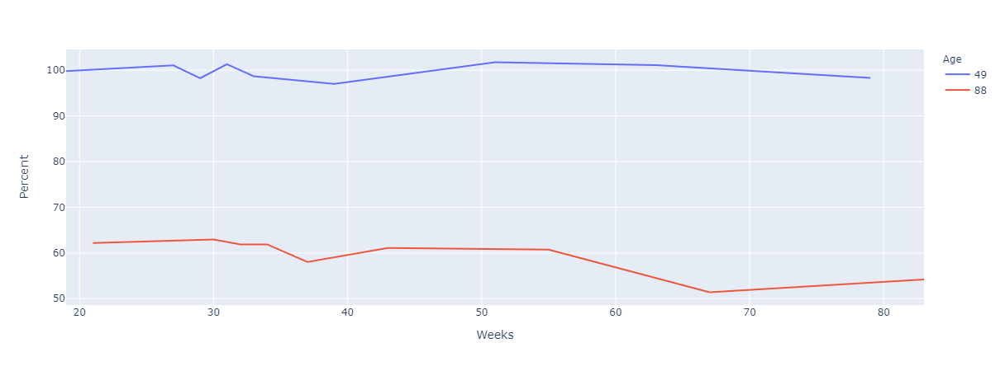

In [ ]:
patient = train_df[(train_df['Age'] == train_df['Age'].max()) | (train_df['Age'] == train_df['Age'].min())]
fig = px.line(patient, x="Weeks", y="Percent", color='Age',line_group="Sex", hover_name="SmokingStatus")

patient = train_df[(train_df['Age'] == train_df['Age'].max()) | (train_df['Age'] == train_df['Age'].min())]
fig = px.line(patient, x="Weeks", y="Percent", color='Age',line_group="Sex", hover_name="SmokingStatus")

fig.show()

### Percent vs Age

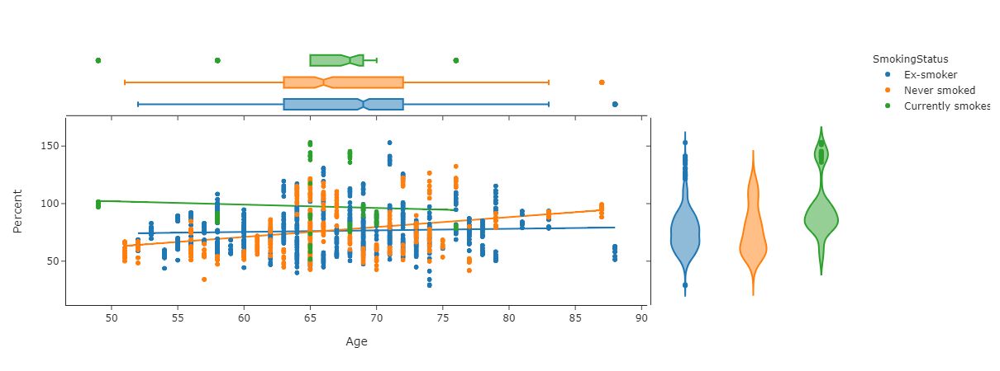

In [ ]:
fig = px.scatter(train_df, x="Age", y="Percent", color="SmokingStatus", marginal_y="violin",
           marginal_x="box", trendline="ols", template="simple_white")
fig.show()

### FVC vs Percent

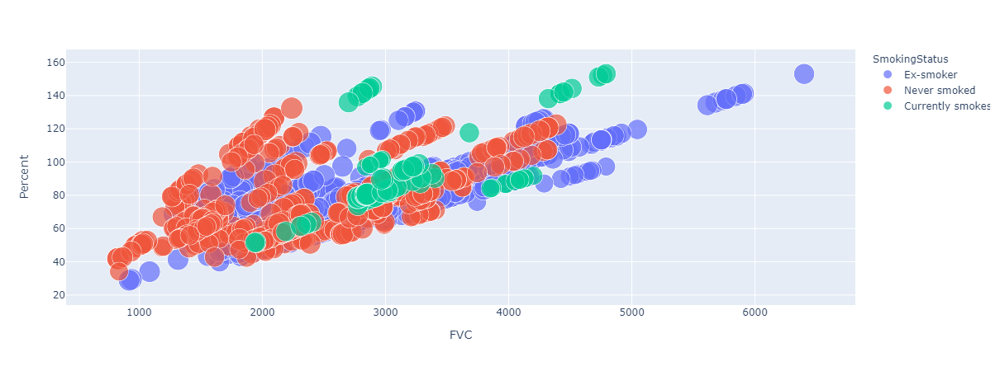

In [ ]:
fig = px.scatter(train_df, x="FVC", y="Percent", color='SmokingStatus', size='Age',
                 hover_name='SmokingStatus',hover_data=['Weeks'])
fig.show()

## Patient Overlap

## Correlation among varous features

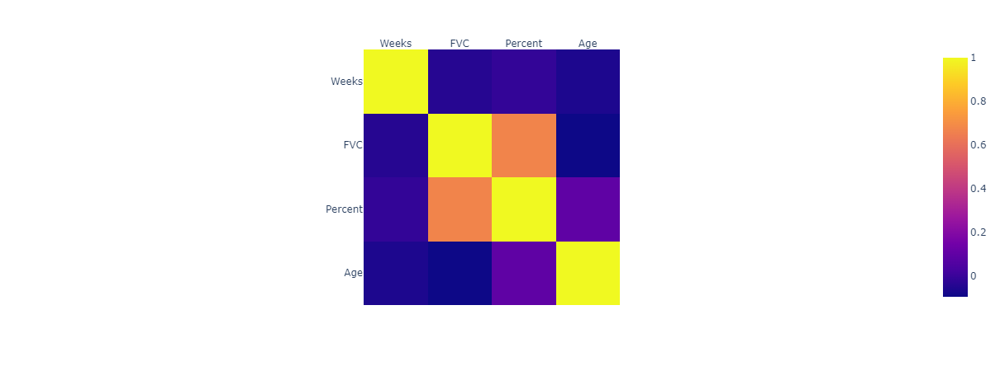

In [ ]:
corrmat = train_df.corr()
fig = px.imshow(corrmat, x=corrmat.columns, y=corrmat.columns)
fig.update_xaxes(side="top")
fig.show()

* There is high correlation between FVC and Percent: when the volume of air increases, the Percent increases as well.

* There is no correlation between FVC/Percent and Age, meaning that Age has no influence on the volume of exhaled air.

# <div class="alert alert-block alert-info">4. <a id='ImageVisuals'>Visualising DICOM Images</a></div>

## Patients & their CT Scans in Training Images Folder

In [ ]:
## Patients & their CT Scans in Training Images Folder

file_len = folder_len = 0
files = []

for dirpath, dirnames, filenames in os.walk(train_dir):
    file_len += len(filenames)
    folder_len += len(dirnames)
    files.append(len(filenames))

print("Training folder contains", f'{file_len:,}', "CT scans for all patients.")
print('Training folder have only',f'{folder_len:,}', "unique patients.")

print("\n")

print('Each patient have', f'{round(np.mean(files)):,}', 'average number of CT scans.')
print('Maximum images per patient', f'{round(np.max(files)):,}')
print('Minimum images per patient', f'{round(np.min(files)):,}')

Training folder contains 33,026 CT scans for all patients.
Training folder have only 176 unique patients.


Each patient have 187.0 average number of CT scans.
Maximum images per patient 1,018
Minimum images per patient 0


## Extracting DIOCOM files information in a dataframe

In [ ]:
# https://www.kaggle.com/schlerp/getting-to-know-dicom-and-the-data

def show_dcm_info(file_path):
    #print(colored("Filename.........:",'yellow'),file_path)
    #print()
    print(colored("File Path...........:",'blue'), file_path)

    dataset = pydicom.dcmread(file_path)

    pat_name = dataset.PatientName
    display_name = pat_name.family_name + ", " + pat_name.given_name

    print(colored("Patient's name......:",'blue'), display_name)
    print(colored("Patient id..........:",'blue'), dataset.PatientID)
    print(colored("Patient's Sex.......:",'blue'), dataset.PatientSex)
    print(colored("Modality............:",'blue'), dataset.Modality)
    print(colored("Body Part Examined..:",'blue'), dataset.BodyPartExamined)

    if 'PixelData' in dataset:
        rows = int(dataset.Rows)
        cols = int(dataset.Columns)
        print(colored("Image size..........:",'blue')," {rows:d} x {cols:d}, {size:d} bytes".format(
            rows=rows, cols=cols, size=len(dataset.PixelData)))
        if 'PixelSpacing' in dataset:
            print(colored("Pixel spacing.......:",'blue'),dataset.PixelSpacing)
            dataset.PixelSpacing = [1, 1]
        plt.figure(figsize=(10, 10))
        plt.imshow(dataset.pixel_array, cmap='gray')
        plt.show()

File Path...........: ../input/osic-pulmonary-fibrosis-progression/train/ID00015637202177877247924/377.dcm
Patient's name......: ID00015637202177877247924, 
Patient id..........: ID00015637202177877247924
Patient's Sex.......: 
Modality............: CT
Body Part Examined..: Chest
Image size..........:  768 x 768, 1179648 bytes
Pixel spacing.......: [0.522135417, 0.522135417]


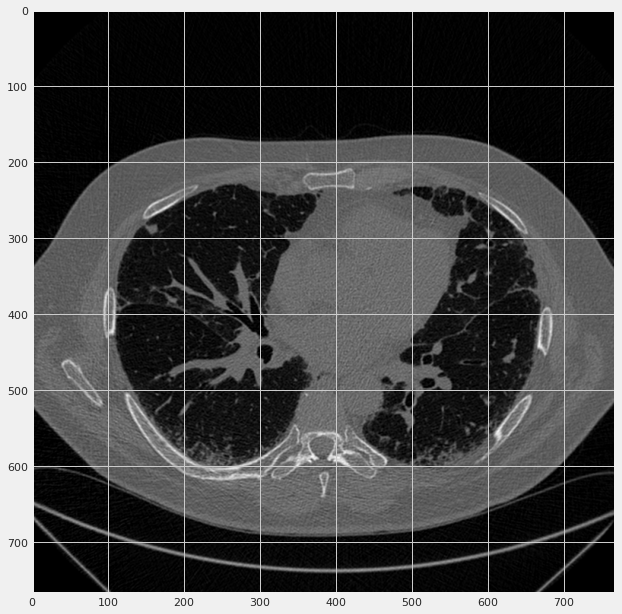

In [ ]:
for file_path in glob.glob(train_dir + '*/*.dcm'):
    show_dcm_info(file_path)
    break # Comment this out to see all

File Path...........: ../input/osic-pulmonary-fibrosis-progression/train/ID00027637202179689871102/11.dcm
Patient's name......: ID00027637202179689871102, 
Patient id..........: ID00027637202179689871102
Patient's Sex.......: 
Modality............: CT
Body Part Examined..: Chest
Image size..........:  768 x 768, 1179648 bytes
Pixel spacing.......: [0.591145833, 0.591145833]


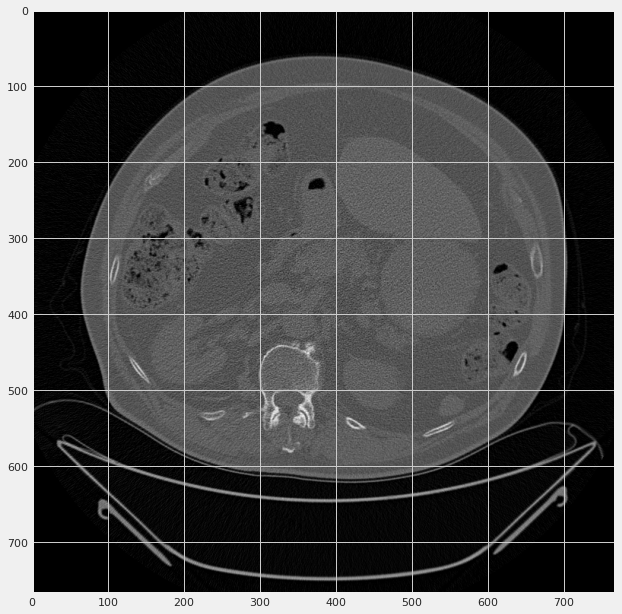

In [ ]:
show_dcm_info(train_dir + 'ID00027637202179689871102/11.dcm')

total images for patient ID00123637202217151272140:  258


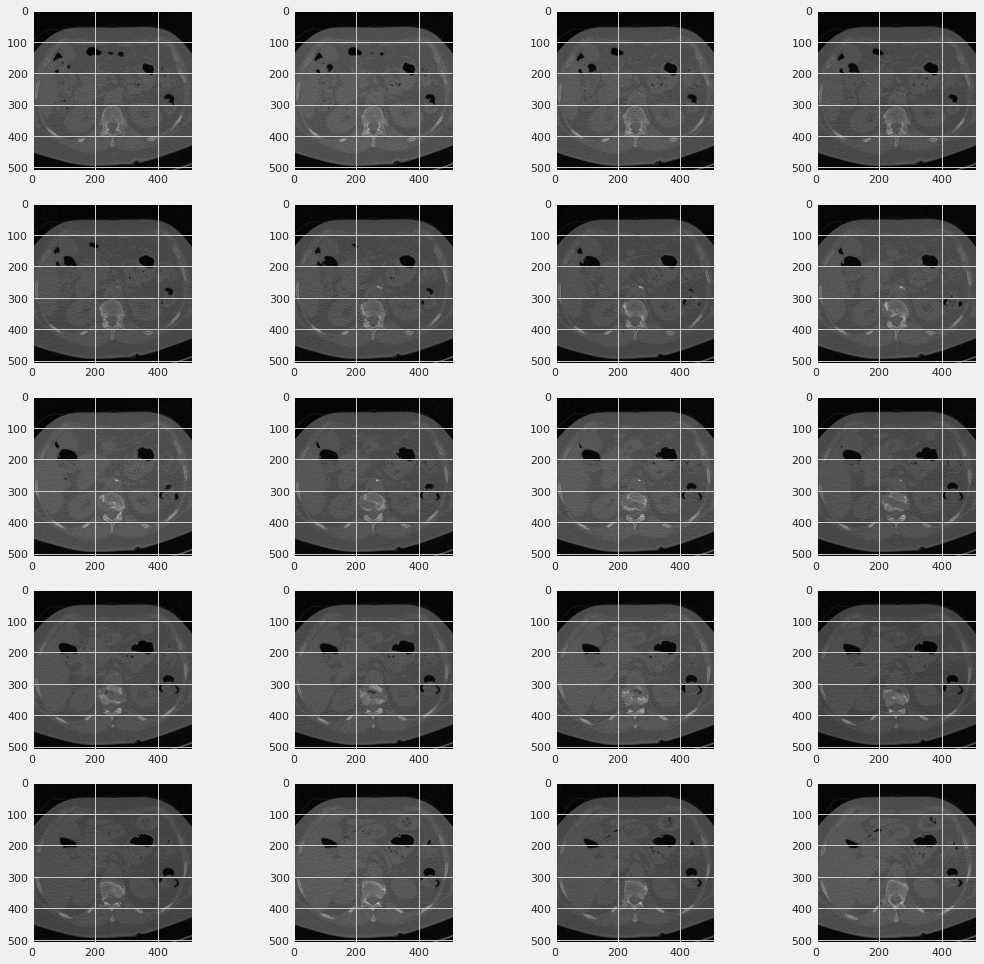

In [ ]:
patient_dir = train_dir + "ID00123637202217151272140"

print("total images for patient ID00123637202217151272140: ", len(os.listdir(patient_dir)))

# view first (columns*rows) images in order
fig=plt.figure(figsize=(16, 16))
columns = 4
rows = 5
imglist = os.listdir(patient_dir)
for i in range(1, columns*rows +1):
    filename = patient_dir + "/" + str(i) + ".dcm"
    ds = pydicom.dcmread(filename)
    fig.add_subplot(rows, columns, i)
    plt.imshow(ds.pixel_array, cmap='gray')
plt.show()

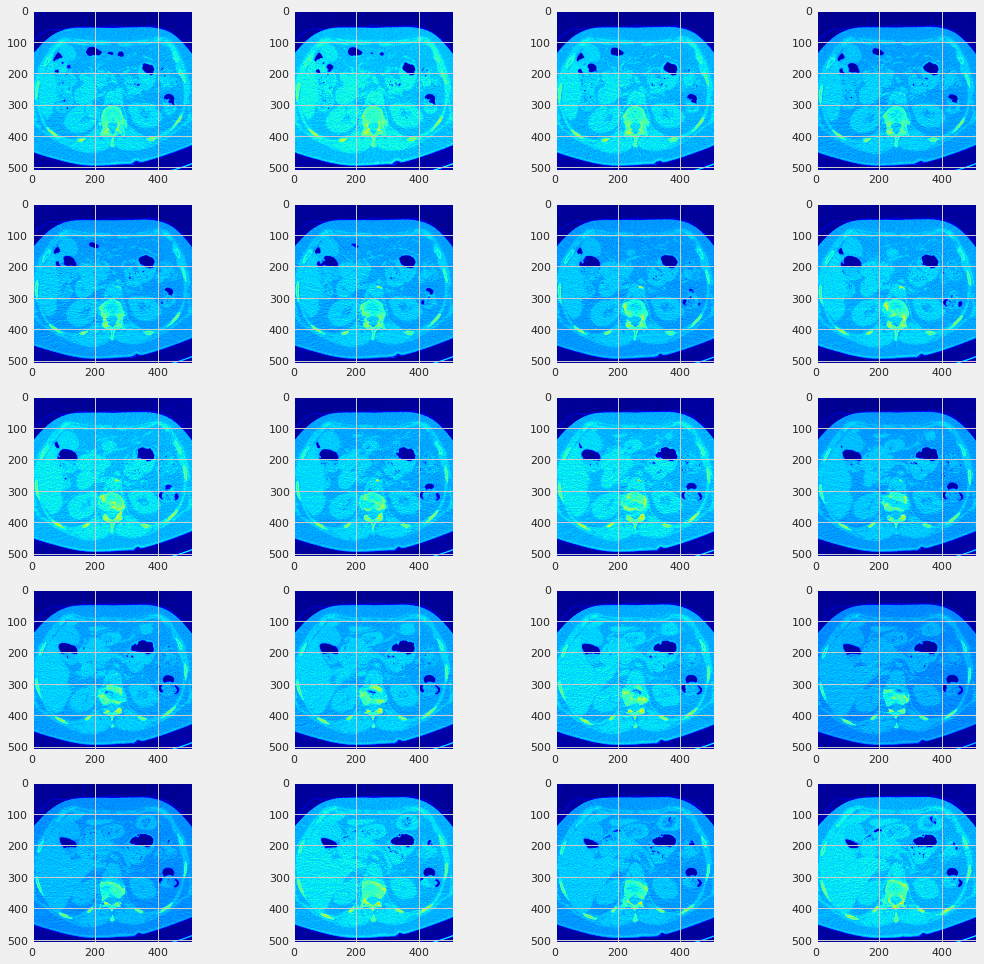

In [ ]:
# view first (columns*rows) images in order
fig=plt.figure(figsize=(16, 16))
columns = 4
rows = 5
imglist = os.listdir(patient_dir)
for i in range(1, columns*rows +1):
    filename = patient_dir + "/" + str(i) + ".dcm"
    ds = pydicom.dcmread(filename)
    fig.add_subplot(rows, columns, i)
    plt.imshow(ds.pixel_array, cmap='jet')
    #plt.imshow(cv2.cvtColor(ds.pixel_array, cv2.COLOR_BGR2RGB))
plt.show()

In [ ]:
# Ref :
# https://www.kaggle.com/gzuidhof/full-preprocessing-tutorial
# https://www.kaggle.com/akh64bit/full-preprocessing-tutorial
# https://www.researchgate.net/post/How_can_I_convert_pixel_intensity_values_to_housefield_CT_number

# Load the scans in given folder path
def load_scan(path):
    slices = [pydicom.read_file(path + '/' + s) for s in os.listdir(path)]
    slices.sort(key = lambda x: float(x.ImagePositionPatient[2]))
    try:
        slice_thickness = np.abs(slices[0].ImagePositionPatient[2] - slices[1].ImagePositionPatient[2])
    except:
        slice_thickness = np.abs(slices[0].SliceLocation - slices[1].SliceLocation)

    for s in slices:
        s.SliceThickness = slice_thickness

    return slices

In [ ]:
def get_pixels_hu(slices):
    image = np.stack([s.pixel_array for s in slices])
    # Convert to int16 (from sometimes int16),
    # should be possible as values should always be low enough (<32k)
    image = image.astype(np.int16)

    # Set outside-of-scan pixels to 0
    # The intercept is usually -1024, so air is approximately 0
    image[image == -2000] = 0

    # Convert to Hounsfield units (HU)
    for slice_number in range(len(slices)):

        intercept = slices[slice_number].RescaleIntercept
        slope = slices[slice_number].RescaleSlope

        if slope != 1:
            image[slice_number] = slope * image[slice_number].astype(np.float64)
            image[slice_number] = image[slice_number].astype(np.int16)

        image[slice_number] += np.int16(intercept)

    return np.array(image, dtype=np.int16)

Let's take a look at one of the patients.

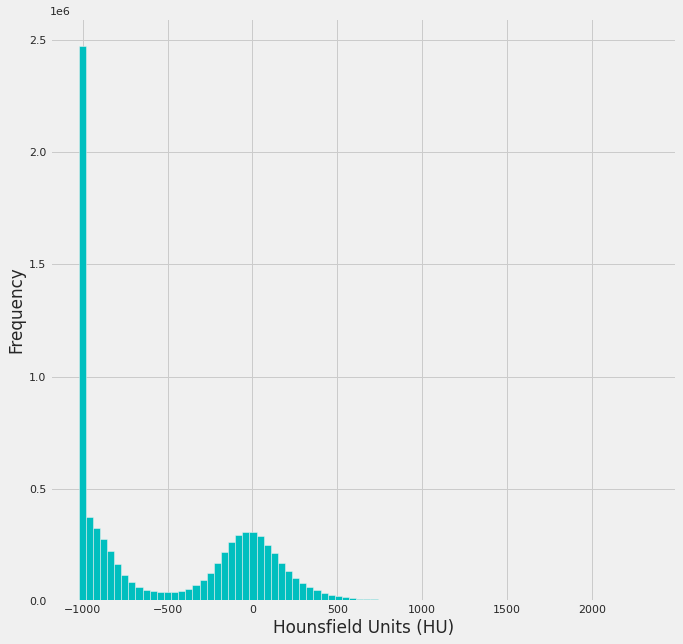

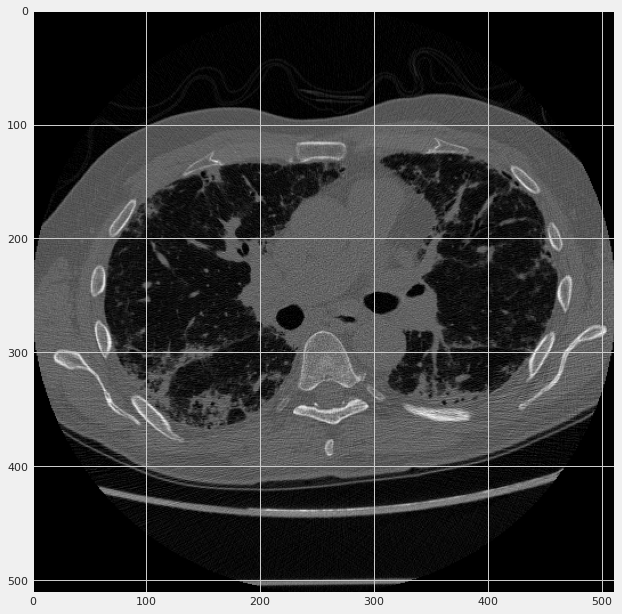

In [ ]:
first_patient = load_scan(train_dir + patient_ids[0])
first_patient_pixels = get_pixels_hu(first_patient)

plt.figure(figsize=(10, 10))
plt.hist(first_patient_pixels.flatten(), bins=80, color='c')
plt.xlabel("Hounsfield Units (HU)")
plt.ylabel("Frequency")
plt.show()

# Show some slice in the middle
plt.figure(figsize=(10, 10))
plt.imshow(first_patient_pixels[15], cmap=plt.cm.gray)
plt.show()

Looking at the table from Wikipedia and this histogram, we can clearly see which pixels are air and which are tissue. We will use this for lung segmentation in a bit

Let's take a look at the first dicom file of a patient:

In [ ]:
first_patient_scan = load_scan(train_dir + patient_ids[0])

In [ ]:
first_patient_scan[0]

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 200
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 2.25.95516132172461492040664114239048418896
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.1
(0002, 0013) Implementation Version Name         SH: 'OSIRIX_361'
(0002, 0016) Source Application Entity Title     AE: 'ANONYMOUS'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'AXIAL']
(0008, 0018) SOP Instance UID                    UI: 2.25.95516132172461492040664114239048418896
(0008, 0060) Modality                            CS: 'CT'
(0008, 0070) 

### Visualization using gif

In [ ]:
def set_lungwin(img, hu=[-1200., 600.]):
    lungwin = np.array(hu)
    newimg = (img-lungwin[0]) / (lungwin[1]-lungwin[0])
    newimg[newimg < 0] = 0
    newimg[newimg > 1] = 1
    newimg = (newimg * 255).astype('uint8')
    return newimg

In [ ]:
first_patient_scan_array = set_lungwin(get_pixels_hu(first_patient_scan))

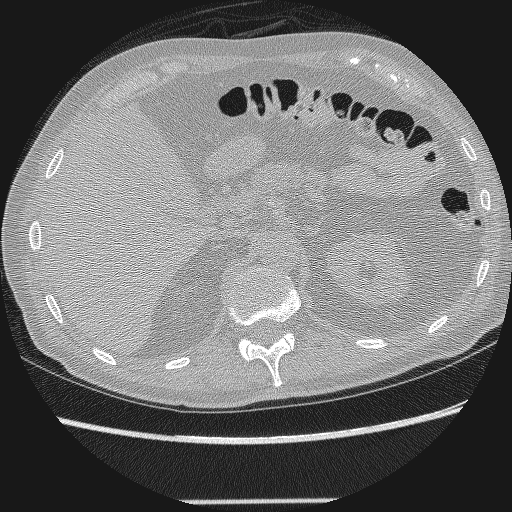

In [ ]:
import imageio
from IPython.display import Image

imageio.mimsave("/tmp/gif.gif", first_patient_scan_array, duration=0.00001)
Image(filename="/tmp/gif.gif", format='png')

### Transforming to Hounsfield Units


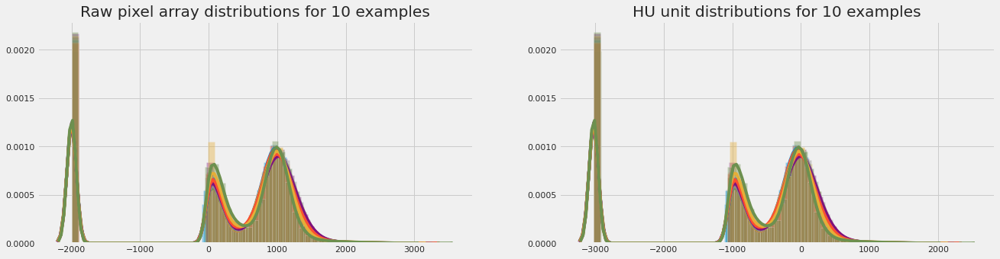

In [ ]:
fig, ax = plt.subplots(1,2,figsize=(20,5))
for n in range(10):
    image = first_patient_scan[n].pixel_array.flatten()
    rescaled_image = image * first_patient_scan[n].RescaleSlope + first_patient_scan[n].RescaleIntercept
    sns.distplot(image.flatten(), ax=ax[0]);
    sns.distplot(rescaled_image.flatten(), ax=ax[1])
ax[0].set_title("Raw pixel array distributions for 10 examples")
ax[1].set_title("HU unit distributions for 10 examples");

There are some raw values at -2000. They correspond to images with a circular boundary within the image. The "outside" of this circle value is often set to -2000 (or in other competitions I found also -3000) by default.

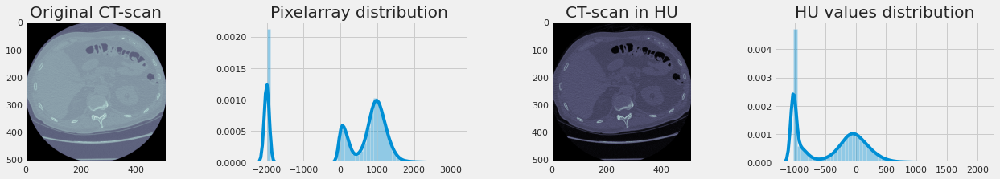

In [ ]:
fig, ax = plt.subplots(1,4,figsize=(20,3))
ax[0].set_title("Original CT-scan")
ax[0].imshow(first_patient_scan[0].pixel_array, cmap="bone")
ax[1].set_title("Pixelarray distribution");
sns.distplot(first_patient_scan[0].pixel_array.flatten(), ax=ax[1]);

ax[2].set_title("CT-scan in HU")
ax[2].imshow(first_patient_pixels[0], cmap="bone")
ax[3].set_title("HU values distribution");
sns.distplot(first_patient_pixels[0].flatten(), ax=ax[3]);

for m in [0,2]:
    ax[m].grid(False)

The scan of our example patient had a circular boundary and now all raw values per slice are scaled to H-units.

## Tissue segmentation

A scan may have a pixel spacing of [2.5, 0.5, 0.5], which means that the distance between slices is 2.5 millimeters. For a different scan this may be [1.5, 0.725, 0.725], this can be problematic for automatic analysis (e.g. using ConvNets)!

In order to reduce the problem space, we can segment the lungs (and usually some tissue around it).

It involves quite a few smart steps.

Threshold the image (-320 HU is a good threshold, but it doesn't matter much for this approach).
Do connected components, determine label of air around person, fill this with 1s in the binary image
Optionally: For every axial slice in the scan, determine the largest solid connected component (the body+air around the person), and set others to 0. This fills the structures in the lungs in the mask.
Keep only the largest air pocket (the human body has other pockets of air here and there).

With -320 we are separating between lungs (-700) /air (-1000) and tissue with values close to water (0).

In [ ]:
def segment_lung_mask(image):
    segmented = np.zeros(image.shape)

    for n in range(image.shape[0]):
        binary_image = np.array(image[n] > -320, dtype=np.int8)+1
        labels = measure.label(binary_image)

        background_label_1 = labels[0,0]
        background_label_2 = labels[0,-1]
        background_label_3 = labels[-1,0]
        background_label_4 = labels[-1,-1]

        #Fill the air around the person
        binary_image[background_label_1 == labels] = 2
        binary_image[background_label_2 == labels] = 2
        binary_image[background_label_3 == labels] = 2
        binary_image[background_label_4 == labels] = 2

        #We have a lot of remaining small signals outside of the lungs that need to be removed.
        #In our competition closing is superior to fill_lungs
        selem = disk(4)
        binary_image = closing(binary_image, selem)

        binary_image -= 1 #Make the image actual binary
        binary_image = 1-binary_image # Invert it, lungs are now 1

        segmented[n] = binary_image.copy() * image[n]

    return segmented

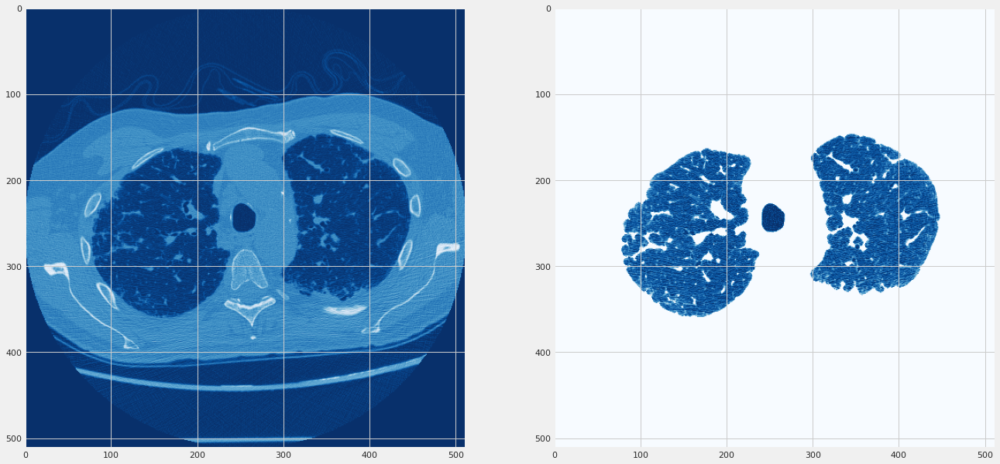

In [ ]:
segmented = segment_lung_mask(np.array([first_patient_pixels[20]]))

fig, ax = plt.subplots(1,2,figsize=(20,10))
ax[0].imshow(first_patient_pixels[20], cmap="Blues_r")
ax[1].imshow(segmented[0], cmap="Blues_r")

In [ ]:
segmented_lungs = segment_lung_mask(first_patient_pixels)

In [ ]:
segmented_lungs.shape

(30, 512, 512)

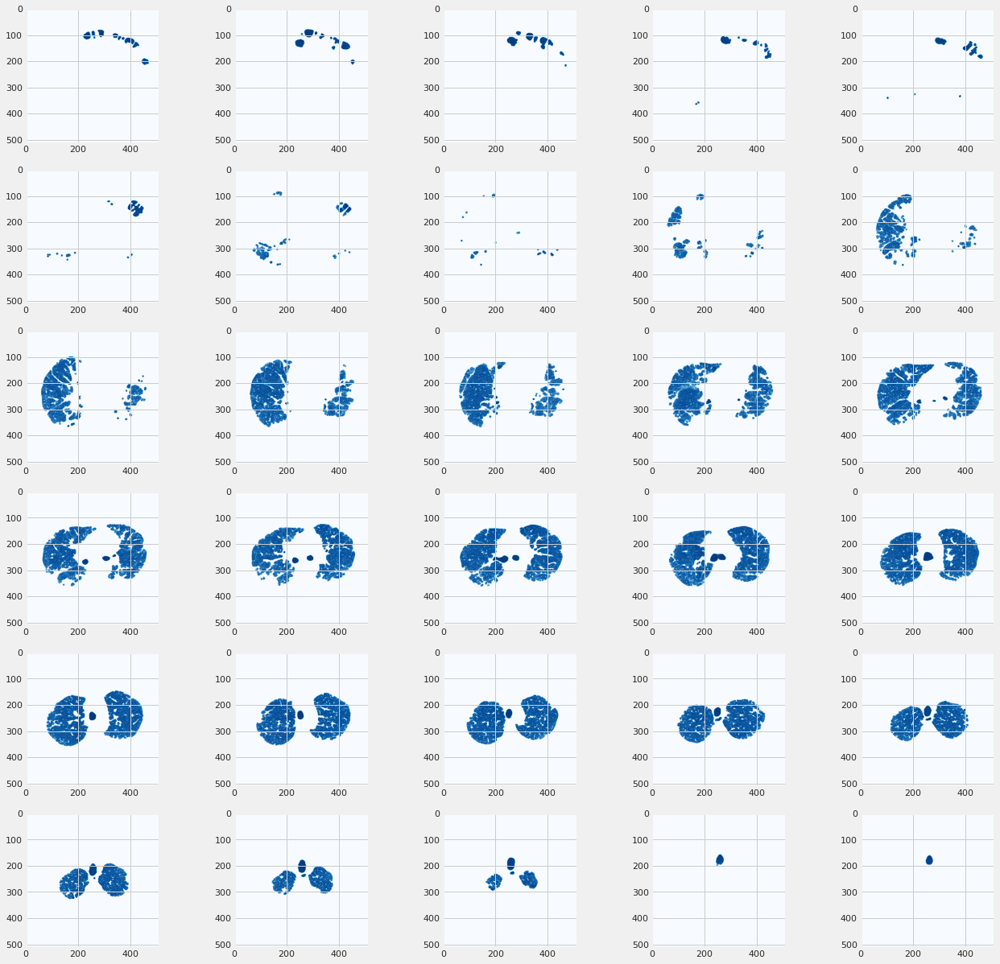

In [ ]:
fig, ax = plt.subplots(6,5, figsize=(20,20))
for n in range(6):
    for m in range(5):
        ax[n,m].imshow(segmented_lungs[n*5+m], cmap="Blues_r")

## Reset the index

In [ ]:
train_df.reset_index(inplace = True , drop = True)
patient_df.reset_index(inplace = True , drop = True)
test_df.reset_index(inplace = True , drop = True)

# Model Building

In [ ]:
# train_df = pd.read_csv('../input/osic-pulmonary-fibrosis-progression/train.csv', encoding = 'latin-1')
# test_df = pd.read_csv('../input/osic-pulmonary-fibrosis-progression/test.csv', encoding = 'latin-1')
# submission_df = pd.read_csv('../input/osic-pulmonary-fibrosis-progression/sample_submission.csv', encoding = 'latin-1')

**Steps in MODEL BUILDING**

1. Input Layer:
   input_1 (InputLayer): This layer defines the input for the model. It expects input data with a shape of (512, 512, 1),      indicating an image with dimensions 512x512 pixels and a single channel (grayscale).
   
2. EfficientNet Backbone:
   efficientnet-b5 (Functional): This layer represents the EfficientNetB5 model, which serves as the backbone of the neural    network. It takes the input from the previous layer and processes it through a series of convolutional, pooling, and        other operations to extract meaningful features from the input image. The output shape is determined by the architecture    of EfficientNetB5.
   
3. Global Average Pooling:
   global_average_pooling2d (GlobalAveragePooling2D): This layer performs global average pooling over the spatial              dimensions of the feature maps obtained from the EfficientNet backbone. It reduces the spatial dimensions of the feature    maps to a single vector by taking the average of all values in each feature map.
   
4. Additional Input Layer:
   input_2 (InputLayer): This layer defines an additional input for the model. It expects input data with a shape of (None,    5), indicating a batch of samples where each sample contains 5 additional features. These features could be related to   the data but are not directly derived from the image.
   
5. Noise Augmentation:
   gaussian_noise (GaussianNoise): This layer applies Gaussian noise with a standard deviation of 0.2 to the additional        input data. This can help regularize the model and improve its generalization ability by adding random perturbations to    the input features.
   
6. Concatenation:
   concatenate (Concatenate): This layer concatenates the output of the global average pooling layer from the EfficientNet    backbone and the noise-augmented additional input features. This combines the high-level image features extracted by the    backbone with the additional features.
   
7. Dropout Regularization:
   dropout (Dropout): This layer applies dropout regularization with a dropout rate specified by Dropout_model. Dropout        randomly sets a fraction of input units to zero during training, which helps prevent overfitting by forcing the model to    learn more robust features.
   
8. Output Layer:
   dense (Dense): This layer is a dense (fully connected) layer with one output unit. It takes the concatenated features as    input and produces a single output, which could be the predicted value in regression tasks or the probability              distribution in classification tasks.

In [ ]:
img_sub = submission_df[["Patient_Week","FVC","Confidence"]].copy()
print(img_sub.sample(5))

                      Patient_Week   FVC  Confidence
299   ID00426637202313170790466_47  2000         100
723  ID00423637202312137826377_132  2000         100
647  ID00422637202311677017371_117  2000         100
520   ID00419637202311204720264_92  2000         100
114   ID00426637202313170790466_10  2000         100


* Dropout_model = 0.38559: Assigns a dropout rate of 0.38559 to a neural network model to prevent overfitting.
* FVC_weight = 0.2: Assigns a weight of 0.2 to the Forced Vital Capacity (FVC) metric in the model.
* Confidence_weight = 0.15: Assigns a weight of 0.15 to the confidence metric in the model.
* config.gpu_options.allow_growth = True: Configures TensorFlow to dynamically allocate GPU memory.
* session = tf.compat.v1.Session(config=config): Creates a TensorFlow session with the specified configuration.

In [ ]:
Dropout_model = 0.38559
FVC_weight = 0.2
Confidence_weight = 0.15

config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.compat.v1.Session(config=config)

This function provides a convenient way to obtain pre-trained EfficientNet models with various model sizes (b0 through b7) for use in tasks such as image classification or feature extraction.

In [ ]:
def get_efficientnet(model, shape):
    models_dict = {
        'b0': efn.EfficientNetB0(input_shape=shape,weights=None,include_top=False),
        'b1': efn.EfficientNetB1(input_shape=shape,weights=None,include_top=False),
        'b2': efn.EfficientNetB2(input_shape=shape,weights=None,include_top=False),
        'b3': efn.EfficientNetB3(input_shape=shape,weights=None,include_top=False),
        'b4': efn.EfficientNetB4(input_shape=shape,weights=None,include_top=False),
        'b5': efn.EfficientNetB5(input_shape=shape,weights=None,include_top=False),
        'b6': efn.EfficientNetB6(input_shape=shape,weights=None,include_top=False),
        'b7': efn.EfficientNetB7(input_shape=shape,weights=None,include_top=False)
    }
    return models_dict[model]

In [ ]:
def build_model(shape=(512, 512, 1), model_class=None):
    inp = Input(shape=shape)
    base = get_efficientnet(model_class, shape)
    x = base(inp)
    x = GlobalAveragePooling2D()(x)
    inp2 = Input(shape=(5,))  # add the feature of MinFVC
    x2 = tf.keras.layers.GaussianNoise(0.2)(inp2)
    x = Concatenate()([x, x2])
    x = Dropout(Dropout_model)(x)
    x = Dense(1)(x)
    model = Model([inp, inp2] , x)

#     weights = [w for w in os.listdir('../input/osic-model-weights') if model_class in w][0]
#     model.load_weights('../input/osic-model-weights/' + weights)
    return model

In [ ]:
model_classes = ['b5'] #['b0','b1','b2','b3',b4','b5','b6','b7']
models = [build_model(shape=(512, 512, 1), model_class=m) for m in model_classes]
print('Number of models: ' + str(len(models)))

Number of models: 1


In [ ]:
model = models[0]
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 1) 0                                            
__________________________________________________________________________________________________
efficientnet-b5 (Model)         (None, 16, 16, 2048) 28512656    input_1[0][0]                    
__________________________________________________________________________________________________
input_10 (InputLayer)           [(None, 5)]          0                                            
__________________________________________________________________________________________________
global_average_pooling2d (Globa (None, 2048)         0           efficientnet-b5[1][0]            
______________________________________________________________________________________________

 **"batch size"** refers to the number of data samples processed by the model in each training iteration or batch.

In [ ]:
BATCH_SIZE=128

In [ ]:
submission_df['Patient'] = submission_df['Patient_Week'].apply(lambda x:x.split('_')[0])
submission_df['Weeks'] = submission_df['Patient_Week'].apply(lambda x: int(x.split('_')[-1]))
submission_df =  submission_df[['Patient','Weeks','Confidence','Patient_Week']]
submission_df = submission_df.merge(test_df.drop('Weeks', axis=1), on="Patient")

submission_df.head()

,Patient,Weeks,Confidence,Patient_Week,FVC,Percent,Age,Sex,SmokingStatus
0,ID00419637202311204720264,-12,100,ID00419637202311204720264_-12,3020,70.186855,73,Male,Ex-smoker
1,ID00419637202311204720264,-11,100,ID00419637202311204720264_-11,3020,70.186855,73,Male,Ex-smoker
2,ID00419637202311204720264,-10,100,ID00419637202311204720264_-10,3020,70.186855,73,Male,Ex-smoker
3,ID00419637202311204720264,-9,100,ID00419637202311204720264_-9,3020,70.186855,73,Male,Ex-smoker
4,ID00419637202311204720264,-8,100,ID00419637202311204720264_-8,3020,70.186855,73,Male,Ex-smoker


In [ ]:
# Merge Train, Test and Submission CSV files
train_df['WHERE'] = 'train'
test_df['WHERE'] = 'val'
submission_df['WHERE'] = 'test'

# Merge train, test and submission dataset
data = train_df.append([test_df, submission_df])

print(colored('Train data set shape.......: ','yellow'), train_df.shape)
print(colored('Test data set shape........: ','green'), test_df.shape)
print(colored('Submission data set shape..: ','blue'), submission_df.shape)
print(colored('Comibined data set shape...: ','red'), data.shape)

print("\n")

print(colored('Unique Patient in Train data set shape.......: ','yellow'), train_df.Patient.nunique())
print(colored('Unique Patient in Test data set shape........: ','green'), test_df.Patient.nunique())
print(colored('Unique Patient in Submission data set shape..: ','blue'), submission_df.Patient.nunique())
print(colored('Unique Patient in Comibined data set shape...: ','red'), data.Patient.nunique())

Train data set shape.......:  (1549, 8)
Test data set shape........:  (5, 8)
Submission data set shape..:  (730, 10)
Comibined data set shape...:  (2284, 10)


Unique Patient in Train data set shape.......:  176
Unique Patient in Test data set shape........:  5
Unique Patient in Submission data set shape..:  5
Unique Patient in Comibined data set shape...:  176


In [ ]:
data.head(3).T

,0,1,2
Patient,ID00007637202177411956430,ID00007637202177411956430,ID00007637202177411956430
Weeks,-4,5,7
FVC,2315,2214,2061
Percent,58.2536,55.7121,51.8621
Age,79,79,79
Sex,Male,Male,Male
SmokingStatus,Ex-smoker,Ex-smoker,Ex-smoker
WHERE,train,train,train
Confidence,NaN,NaN,NaN
Patient_Week,NaN,NaN,NaN


In [ ]:
data['min_week'] = data['Weeks']
data.loc[data.WHERE=='test','min_week'] = np.nan
data['min_week'] = data.groupby('Patient')['min_week'].transform('min')

In [ ]:
base = data.loc[data.Weeks == data.min_week]
base = base[['Patient','FVC']].copy()
base.columns = ['Patient','min_FVC']
base['nb'] = 1
base['nb'] = base.groupby('Patient')['nb'].transform('cumsum')
base = base[base.nb==1]
base.drop('nb', axis=1, inplace=True)

In [ ]:
data = data.merge(base, on='Patient', how='left')
data['base_week'] = data['Weeks'] - data['min_week']

del base

In [ ]:
COLS = ['Sex','SmokingStatus'] #,'Age'
features = []

for col in COLS:
    for mod in data[col].unique():
        features.append(mod)
        data[mod] = (data[col] == mod).astype(int)

In [ ]:
data.head(3).T

,0,1,2
Patient,ID00007637202177411956430,ID00007637202177411956430,ID00007637202177411956430
Weeks,-4,5,7
FVC,2315,2214,2061
Percent,58.2536,55.7121,51.8621
Age,79,79,79
Sex,Male,Male,Male
SmokingStatus,Ex-smoker,Ex-smoker,Ex-smoker
WHERE,train,train,train
Confidence,NaN,NaN,NaN
Patient_Week,NaN,NaN,NaN


In [ ]:
#
data['age'] = (data['Age'] - data['Age'].min() ) / ( data['Age'].max() - data['Age'].min() )
data['BASE'] = (data['min_FVC'] - data['min_FVC'].min() ) / ( data['min_FVC'].max() - data['min_FVC'].min() )
data['week'] = (data['base_week'] - data['base_week'].min() ) / ( data['base_week'].max() - data['base_week'].min() )
data['percent'] = (data['Percent'] - data['Percent'].min() ) / ( data['Percent'].max() - data['Percent'].min() )
data['FVC_Percent'] = data['FVC'] / data['Percent']

features += ['age','percent','week','BASE']
print(features)

['Male', 'Female', 'Ex-smoker', 'Never smoked', 'Currently smokes', 'age', 'percent', 'week', 'BASE']


In [ ]:
train_df = data.loc[data.WHERE=='train']
test_df = data.loc[data.WHERE=='val']
submission_df = data.loc[data.WHERE=='test']

del data

This custom scoring function evaluates how accurately a model predicts patient Forced Vital Capacity (FVC) and its uncertainty. It penalizes prediction errors based on uncertainty levels, ensuring more forgiveness for predictions associated with higher uncertainty. The function incorporates clipping constants to stabilize calculations and normalize errors, providing a comprehensive assessment of the model's performance on FVC prediction tasks.

In [ ]:
C1, C2 = tf.constant(70, dtype='float32'), tf.constant(1000, dtype="float32")

def score(y_true, y_pred):
    tf.dtypes.cast(y_true, tf.float32)
    tf.dtypes.cast(y_pred, tf.float32)
    sigma = y_pred[:, 2] - y_pred[:, 0]
    fvc_pred = y_pred[:, 1]

    #sigma_clip = sigma + C1
    sigma_clip = tf.maximum(sigma, C1)
    delta = tf.abs(y_true[:, 0] - fvc_pred)
    delta = tf.minimum(delta, C2)
    sq2 = tf.sqrt( tf.dtypes.cast(2, dtype=tf.float32) )
    metric = (delta / sigma_clip)*sq2 + tf.math.log(sigma_clip* sq2)

    return K.mean(metric)

Pinball loss is a common loss function utilized in quantile regression tasks. It assesses the accuracy of a model's predictions at different quantiles of the target distribution. By evaluating predictions across various quantiles, it offers insights into the model's ability to capture the variability and uncertainty in the data. Pinball loss is asymmetric, penalizing overestimations and underestimations differently based on the specified quantile. It provides a comprehensive measure of model performance by averaging losses across multiple quantiles, enabling a nuanced understanding of predictive accuracy throughout the target distribution.

In [ ]:
def qloss(y_true, y_pred):
    # Pinball loss for multiple quantiles
    qs = [0.2, 0.50, 0.8]
    q = tf.constant(np.array([qs]), dtype=tf.float32)
    e = y_true - y_pred
    v = tf.maximum(q*e, (q-1)*e)

    return K.mean(v)

In [ ]:
def mloss(_lambda):
    def loss(y_true, y_pred):
        return _lambda * qloss(y_true, y_pred) + (1 - _lambda)*score(y_true, y_pred)
    return loss

The make_model function creates a neural network model for regression tasks. It consists of the following components:

* Input Layer: Accepts input with a specified number of features.
* Dense Layers: Two dense layers with 100 units each and ReLU activation functions process the input.
* Output Layers: Two output layers, p1 with linear activation and p2 with ReLU activation, generate predictions for different aspects of the target variable.
* Final Predictions: The final predictions are computed by combining the outputs of p1 and the cumulative sum of p2 along the feature axis.
* Model Compilation: The model is compiled using a custom loss function (mloss) and the Adam optimizer with specific parameters. It also includes a custom metric (score) for evaluation during training.
*
In short, make_model constructs a neural network model suitable for regression tasks, incorporating custom components for loss calculation and model evaluation.

In [ ]:
def make_model(no_feature):
    z = L.Input((no_feature,), name="Patient")
    x = L.Dense(100, activation="relu", name="d1")(z)
    x = L.Dense(100, activation="relu", name="d2")(x)
    p1 = L.Dense(3, activation="linear", name="p1")(x)
    p2 = L.Dense(3, activation="relu", name="p2")(x)
    preds = L.Lambda(lambda x: x[0] + tf.cumsum(x[1], axis=1), name="preds")([p1, p2])

    model = M.Model(z, preds, name="CNN")
    model.compile(loss=mloss(0.65), optimizer=tf.keras.optimizers.Adam(lr=0.1, beta_1=0.9, beta_2=0.999, epsilon=None, decay=0.01, amsgrad=False), metrics=[score])

    return model

In [ ]:
print(colored('Features for model building : ','yellow'),features)

y = train_df['FVC'].values  # train target
X = train_df[features].values  # fetures (1535, 9)
ze = submission_df[features].values  # fetures of submission (730, 9) e: estimate

print(colored('Training data set shape for model building : ','yellow'),X.shape)
print(colored('Shape of submission.csv: ','yellow'),ze.shape)

nh = X.shape[1]
print(colored('Number of features : ','yellow'),nh)  # feature numbers (9,)

pe = np.zeros((ze.shape[0], 3))  #estimate of prediction
pred = np.zeros((X.shape[0], 3))  # prediction of truth ground

Features for model building :  ['Male', 'Female', 'Ex-smoker', 'Never smoked', 'Currently smokes', 'age', 'percent', 'week', 'BASE']
Training data set shape for model building :  (1549, 9)
Shape of submission.csv:  (730, 9)
Number of features :  9


In [ ]:
net = make_model(nh)
print(net.summary())
print(net.count_params())

Model: "CNN"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
Patient (InputLayer)            [(None, 9)]          0                                            
__________________________________________________________________________________________________
d1 (Dense)                      (None, 100)          1000        Patient[0][0]                    
__________________________________________________________________________________________________
d2 (Dense)                      (None, 100)          10100       d1[0][0]                         
__________________________________________________________________________________________________
p1 (Dense)                      (None, 3)            303         d2[0][0]                         
________________________________________________________________________________________________

In [ ]:
NFOLD = 5 # originally 5
kf = KFold(n_splits=NFOLD)

# %%time
cnt = 0
EPOCHS = 855


for tr_idx, val_idx in kf.split(X):
    cnt += 1
    print("\n")
    print(colored('Fold........... : ','red'),cnt)

    net = make_model(nh)
    net.fit(X[tr_idx], y[tr_idx], batch_size=BATCH_SIZE, epochs=EPOCHS, validation_data=(X[val_idx], y[val_idx]), verbose=0) #

    print(colored('Train.......... : ','yellow'),"train", net.evaluate(X[tr_idx], y[tr_idx], verbose=0, batch_size=BATCH_SIZE))
    print(colored('Validation............ : ','yellow'),"val", net.evaluate(X[val_idx], y[val_idx], verbose=0, batch_size=BATCH_SIZE))

    print(colored('Predict Validation.. : ','yellow'))
    pred[val_idx] = net.predict(X[val_idx], batch_size=BATCH_SIZE, verbose=0)

    print(colored('Predict Test... : ','yellow'))
    pe += net.predict(ze, batch_size=BATCH_SIZE, verbose=0) / NFOLD



Fold........... :  1
Train.......... :  train [32.51316452026367, 6.469763278961182]
Validation............ :  val [40.14204406738281, 6.692830562591553]
Predict Validation.. : 
Predict Test... : 


Fold........... :  2
Train.......... :  train [35.12240219116211, 6.546672821044922]
Validation............ :  val [37.318599700927734, 6.5908427238464355]
Predict Validation.. : 
Predict Test... : 


Fold........... :  3
Train.......... :  train [30.49758529663086, 6.394841194152832]
Validation............ :  val [47.53511428833008, 6.7806396484375]
Predict Validation.. : 
Predict Test... : 


Fold........... :  4
Train.......... :  train [35.53201675415039, 6.568123817443848]
Validation............ :  val [34.39546585083008, 6.531070232391357]
Predict Validation.. : 
Predict Test... : 


Fold........... :  5
Train.......... :  train [33.72048568725586, 6.498561859130859]
Validation............ :  val [40.64671325683594, 6.7671027183532715]
Predict Validation.. : 
Predict Test... : 


In [ ]:
sigma_opt = mean_absolute_error(y, pred[:, 1])
unc = pred[:,2] - pred[:, 0]
sigma_mean = np.mean(unc)

print(sigma_opt, sigma_mean)
print(unc.min(), unc.mean(), unc.max(), (unc>=0).mean())

139.1692173110046 231.66200247481996
-21.9384765625 231.66200247481996 410.411865234375 0.9980632666236281


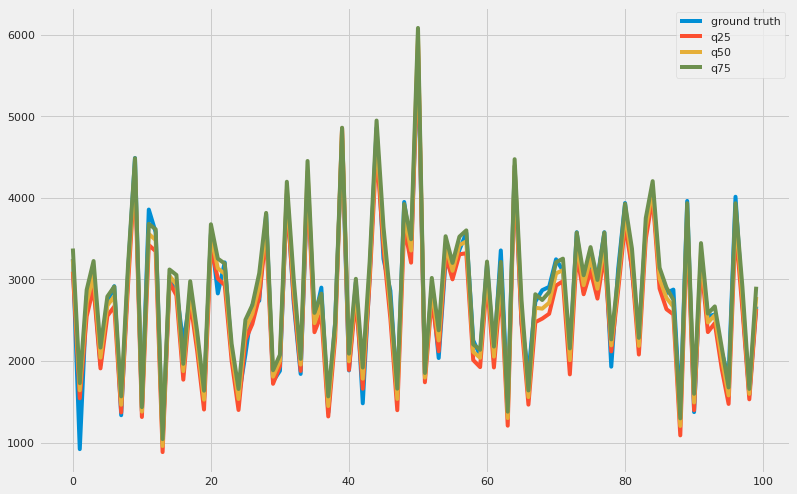

In [ ]:
idxs = np.random.randint(0, y.shape[0], 100)
plt.figure(figsize=(12,8))
plt.plot(y[idxs], label="ground truth")
plt.plot(pred[idxs, 0], label="q25")
plt.plot(pred[idxs, 1], label="q50")
plt.plot(pred[idxs, 2], label="q75")
plt.legend(loc="best")
plt.show()

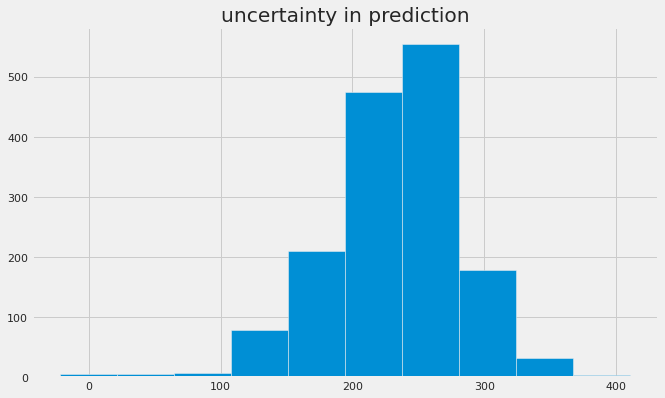

In [ ]:
plt.figure(figsize=(10,6))
plt.hist(unc)
plt.title("uncertainty in prediction")
plt.show()

In [ ]:
submission_df.head()

,Patient,Weeks,FVC,Percent,Age,Sex,SmokingStatus,WHERE,Confidence,Patient_Week,...,Male,Female,Ex-smoker,Never smoked,Currently smokes,age,BASE,week,percent,FVC_Percent
1554,ID00419637202311204720264,-12,3020,70.186855,73,Male,Ex-smoker,test,100.0,ID00419637202311204720264_-12,...,1,0,1,0,0,0.615385,0.3724,0.067901,0.332421,43.028
1555,ID00419637202311204720264,-11,3020,70.186855,73,Male,Ex-smoker,test,100.0,ID00419637202311204720264_-11,...,1,0,1,0,0,0.615385,0.3724,0.074074,0.332421,43.028
1556,ID00419637202311204720264,-10,3020,70.186855,73,Male,Ex-smoker,test,100.0,ID00419637202311204720264_-10,...,1,0,1,0,0,0.615385,0.3724,0.080247,0.332421,43.028
1557,ID00419637202311204720264,-9,3020,70.186855,73,Male,Ex-smoker,test,100.0,ID00419637202311204720264_-9,...,1,0,1,0,0,0.615385,0.3724,0.086420,0.332421,43.028
1558,ID00419637202311204720264,-8,3020,70.186855,73,Male,Ex-smoker,test,100.0,ID00419637202311204720264_-8,...,1,0,1,0,0,0.615385,0.3724,0.092593,0.332421,43.028


In [ ]:
# PREDICTION
submission_df['FVC1'] = 1.*pe[:, 1]
submission_df['Confidence1'] = pe[:, 2] - pe[:, 0]
subm = submission_df[['Patient_Week','FVC','Confidence','FVC1','Confidence1']].copy()
subm.loc[~subm.FVC1.isnull()].head(10)

,Patient_Week,FVC,Confidence,FVC1,Confidence1
1554,ID00419637202311204720264_-12,3020,100.0,2861.449158,239.468750
1555,ID00419637202311204720264_-11,3020,100.0,2859.184570,240.564880
1556,ID00419637202311204720264_-10,3020,100.0,2856.920288,241.660828
1557,ID00419637202311204720264_-9,3020,100.0,2854.656067,242.756836
1558,ID00419637202311204720264_-8,3020,100.0,2852.391724,243.852905
1559,ID00419637202311204720264_-7,3020,100.0,2850.127319,244.948975
1560,ID00419637202311204720264_-6,3020,100.0,2847.862976,246.045105
1561,ID00419637202311204720264_-5,3020,100.0,2845.598877,247.141296
1562,ID00419637202311204720264_-4,3020,100.0,2843.334595,248.237183
1563,ID00419637202311204720264_-3,3020,100.0,2841.070190,249.333374


In [ ]:
subm.loc[~subm.FVC1.isnull(),'FVC'] = subm.loc[~subm.FVC1.isnull(),'FVC1']
if sigma_mean<70:
    subm['Confidence'] = sigma_opt
else:
    subm.loc[~subm.FVC1.isnull(),'Confidence'] = subm.loc[~subm.FVC1.isnull(),'Confidence1']